In [42]:
import os
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [43]:
# Directory path containing CSV files
csv_folder = '/Users/mpillodi/documents/GitHub/wind-data-analysis/csvfolder/'

In [44]:
# Combine data from all CSV files into a single DataFrame
combined_df = pd.DataFrame()

In [45]:
# Iterate through all CSV files in the folder
for file_name in os.listdir(csv_folder):
    if file_name.endswith('.csv'):
        file_path = os.path.join(csv_folder, file_name)
        df = pd.read_csv(file_path)
        combined_df = pd.concat([combined_df, df], ignore_index=True)

In [46]:
# Convert 'date' and 'time' columns to datetime format and set as index
combined_df['datetime'] = pd.to_datetime(combined_df['date'] + ' ' + combined_df['time'])
combined_df.set_index('datetime', inplace=True)
combined_df.sort_index(inplace=True)

In [47]:
# Save the combined DataFrame to a Parquet file
combined_df.to_parquet('/Users/mpillodi/documents/GitHub/wind-data-analysis/csvfolder/combined_data.parquet')

# Display basic information about the combined DataFrame
print(combined_df.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2880 entries, 2013-03-01 00:10:00 to 2013-03-21 00:00:00
Data columns (total 44 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    2880 non-null   object 
 1   time    2880 non-null   object 
 2   period  2880 non-null   int64  
 3   s1a     2880 non-null   float64
 4   s1x     2880 non-null   float64
 5   s1i     2880 non-null   float64
 6   s1s     2880 non-null   float64
 7   s2a     2880 non-null   float64
 8   s2x     2880 non-null   float64
 9   s2i     2880 non-null   float64
 10  s2s     2880 non-null   float64
 11  s3a     2880 non-null   float64
 12  s3x     2880 non-null   float64
 13  s3i     2880 non-null   float64
 14  s3s     2880 non-null   float64
 15  d1a     2880 non-null   int64  
 16  d1s     2880 non-null   int64  
 17  d2a     2880 non-null   int64  
 18  d2s     2880 non-null   int64  
 19  h1a     2880 non-null   int64  
 20  h1x     2880 non-null   int64  
 21  h

In [48]:
print(combined_df)

                           date      time  period       s1a      s1x      s1i  \
datetime                                                                        
2013-03-01 00:10:00  2013-03-01  00:10:00     600   8.57939   9.3092   8.1617   
2013-03-01 00:20:00  2013-03-01  00:20:00     600   8.90069   9.3092   8.5289   
2013-03-01 00:30:00  2013-03-01  00:30:00     600   8.97413   9.7223   8.5289   
2013-03-01 00:40:00  2013-03-01  00:40:00     600   9.91049  10.6862   8.9420   
2013-03-01 00:50:00  2013-03-01  00:50:00     600  10.34654  10.7780   9.9059   
...                         ...       ...     ...       ...      ...      ...   
2013-03-20 23:20:00  2013-03-20  23:20:00     600  12.42122  12.9353  11.6042   
2013-03-20 23:30:00  2013-03-20  23:30:00     600  11.82452  12.7517  10.9157   
2013-03-20 23:40:00  2013-03-20  23:40:00     600  10.92947  12.8894   9.2174   
2013-03-20 23:50:00  2013-03-20  23:50:00     600  10.37867  11.6960   8.8502   
2013-03-21 00:00:00  2013-03


Analysis for column: s1a
Descriptive Statistics:
count    2880.000000
mean        8.040081
std         3.674969
min         0.221000
25%         5.194265
50%         7.831220
75%        10.765377
max        17.961350
Name: s1a, dtype: float64


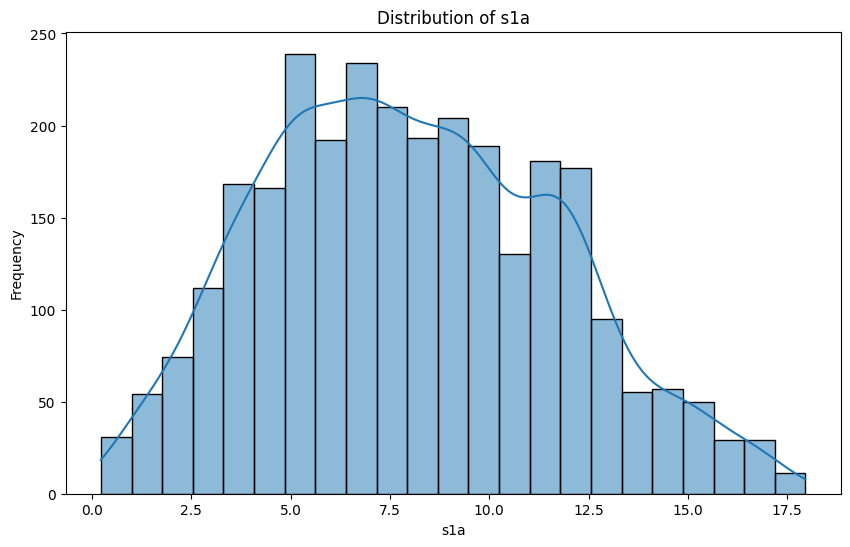


Analysis for column: s1x
Descriptive Statistics:
count    2880.000000
mean        9.530556
std         4.337138
min         0.266900
25%         6.142100
50%         9.171500
75%        12.533675
max        21.977600
Name: s1x, dtype: float64


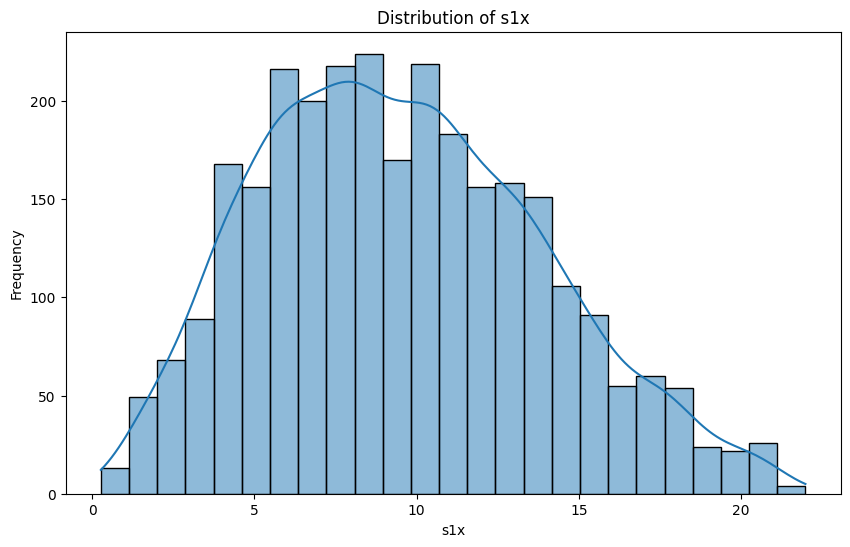


Analysis for column: s1i
Descriptive Statistics:
count    2880.00000
mean        6.40985
std         3.01843
min         0.22100
25%         4.07660
50%         6.27980
75%         8.80430
max        15.50570
Name: s1i, dtype: float64


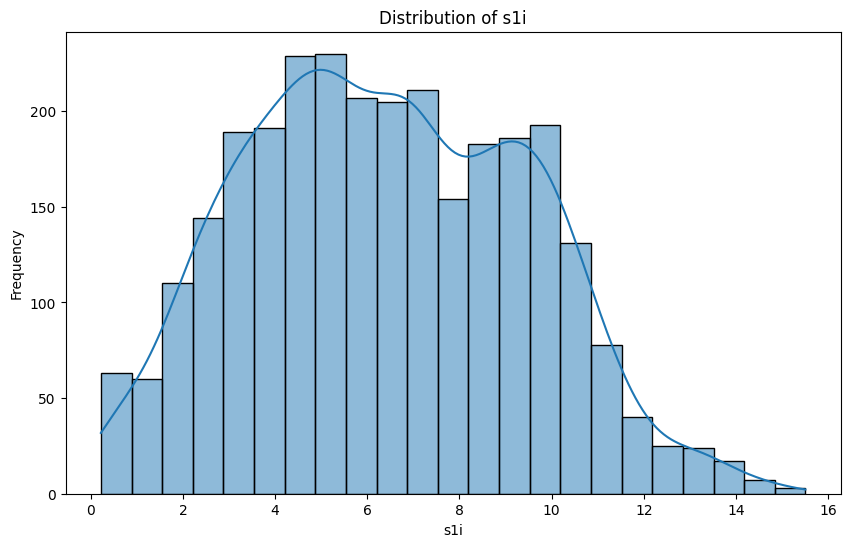


Analysis for column: s1s
Descriptive Statistics:
count    2880.00000
mean        0.57629
std         0.36343
min         0.00459
25%         0.28458
50%         0.50490
75%         0.78948
max         2.35008
Name: s1s, dtype: float64


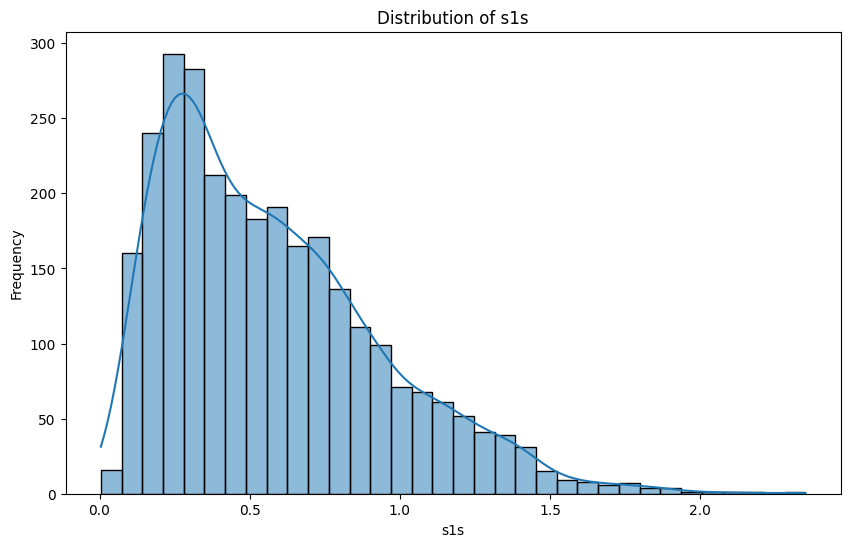


Analysis for column: s2a
Descriptive Statistics:
count    2880.000000
mean        7.950967
std         3.677441
min         0.220000
25%         5.075073
50%         7.743010
75%        10.671430
max        17.877730
Name: s2a, dtype: float64


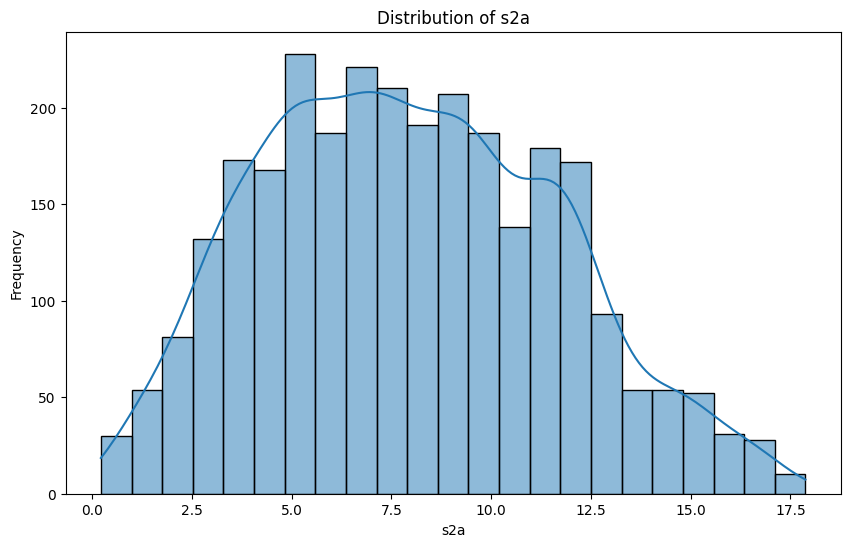


Analysis for column: s2x
Descriptive Statistics:
count    2880.000000
mean        9.470077
std         4.321388
min         0.265900
25%         6.095200
50%         9.170500
75%        12.475300
max        21.609400
Name: s2x, dtype: float64


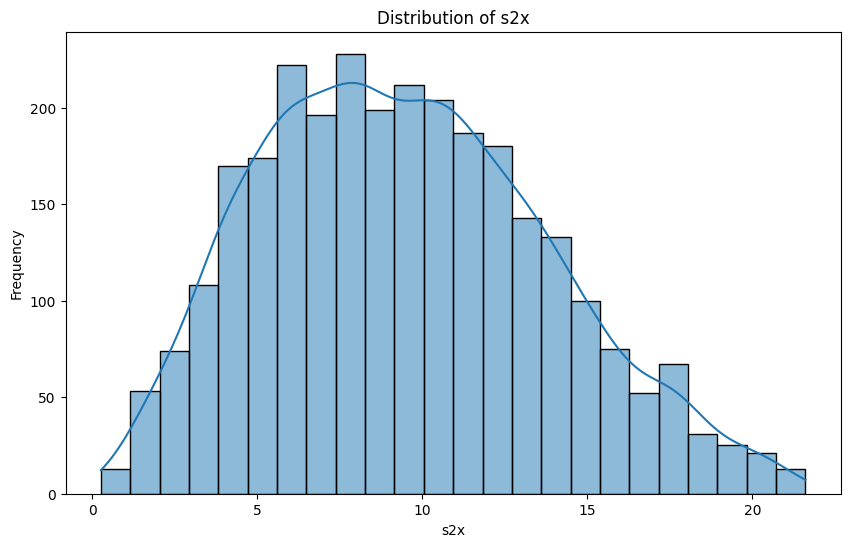


Analysis for column: s2i
Descriptive Statistics:
count    2880.000000
mean        6.277174
std         3.047107
min         0.220000
25%         3.846100
50%         6.187000
75%         8.711500
max        15.275200
Name: s2i, dtype: float64


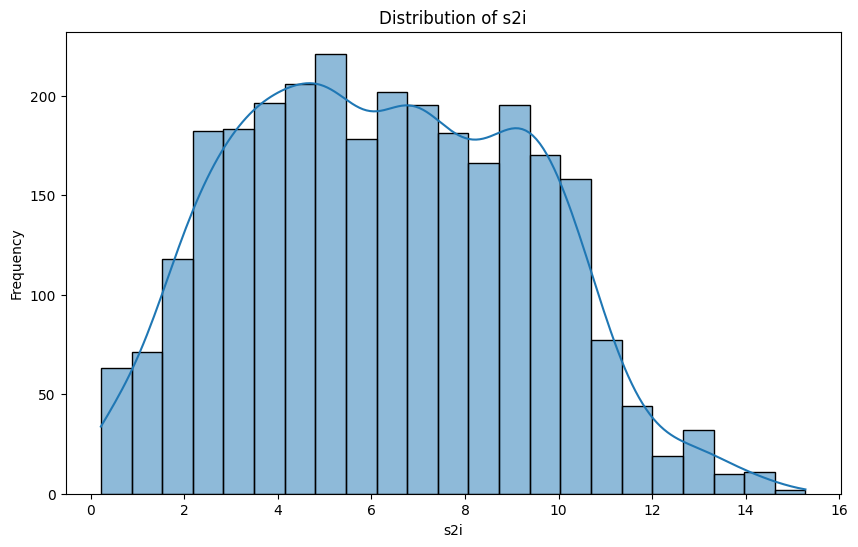


Analysis for column: s2s
Descriptive Statistics:
count    2880.000000
mean        0.592504
std         0.363967
min         0.004590
25%         0.298350
50%         0.527850
75%         0.803250
max         2.331720
Name: s2s, dtype: float64


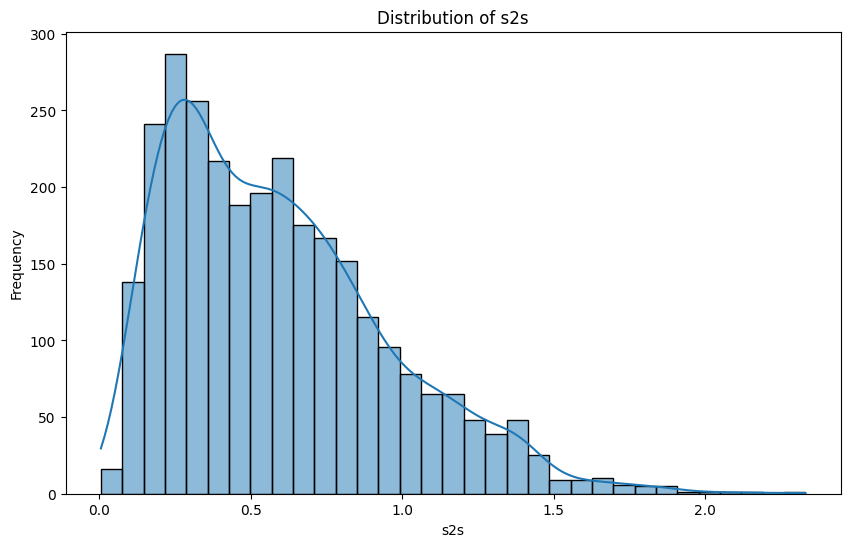


Analysis for column: s3a
Descriptive Statistics:
count    2880.000000
mean        7.517736
std         3.447369
min         0.310150
25%         4.845553
50%         7.378720
75%         9.887810
max        17.671950
Name: s3a, dtype: float64


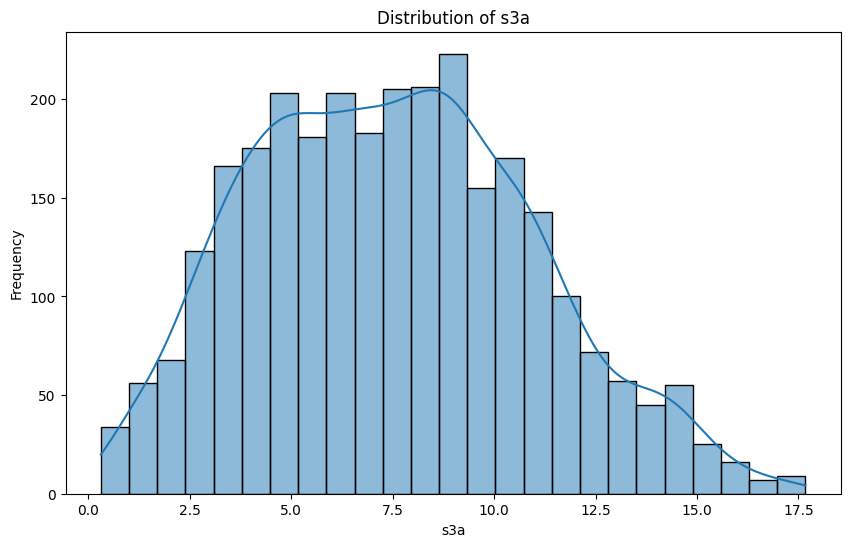


Analysis for column: s3x
Descriptive Statistics:
count    2880.000000
mean        9.105917
std         4.160866
min         0.406480
25%         5.910880
50%         8.892430
75%        11.873980
max        20.864500
Name: s3x, dtype: float64


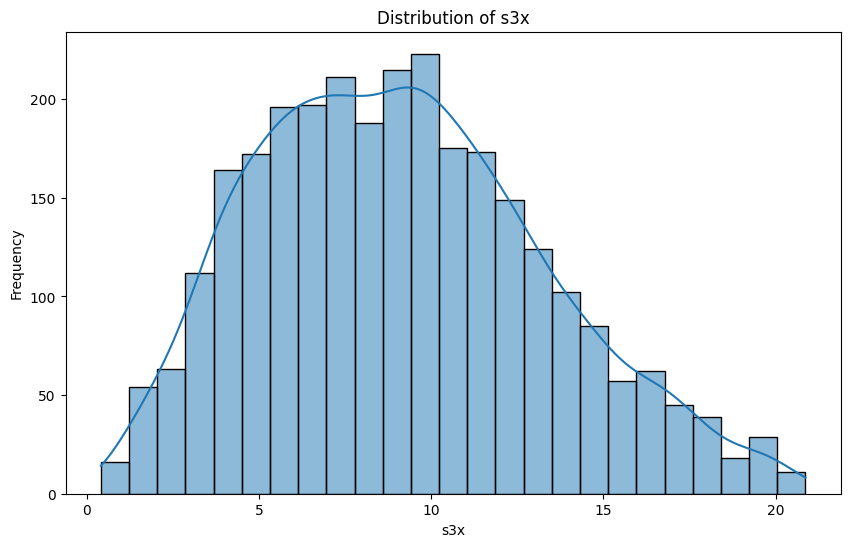


Analysis for column: s3i
Descriptive Statistics:
count    2880.000000
mean        5.784260
std         2.734883
min         0.223000
25%         3.571510
50%         5.727400
75%         7.883290
max        13.662910
Name: s3i, dtype: float64


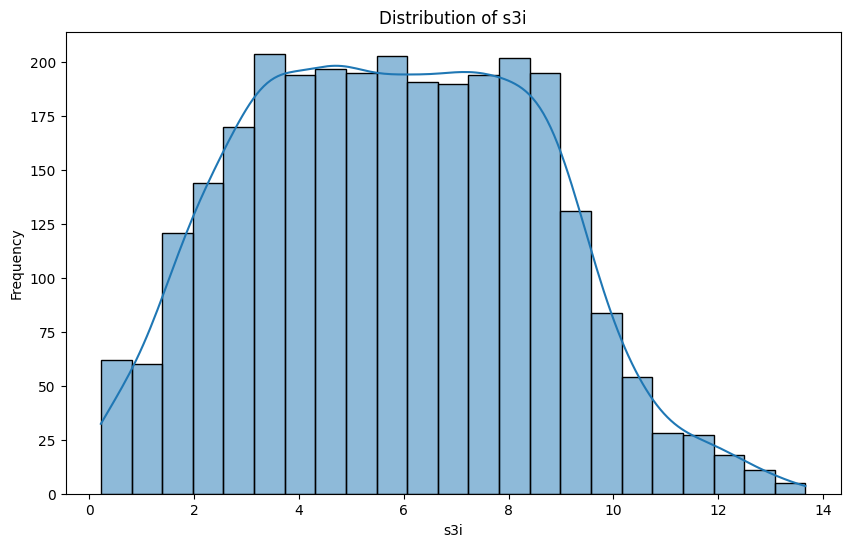


Analysis for column: s3s
Descriptive Statistics:
count    2880.000000
mean        0.615797
std         0.378233
min         0.032110
25%         0.321090
50%         0.536680
75%         0.830250
max         2.311850
Name: s3s, dtype: float64


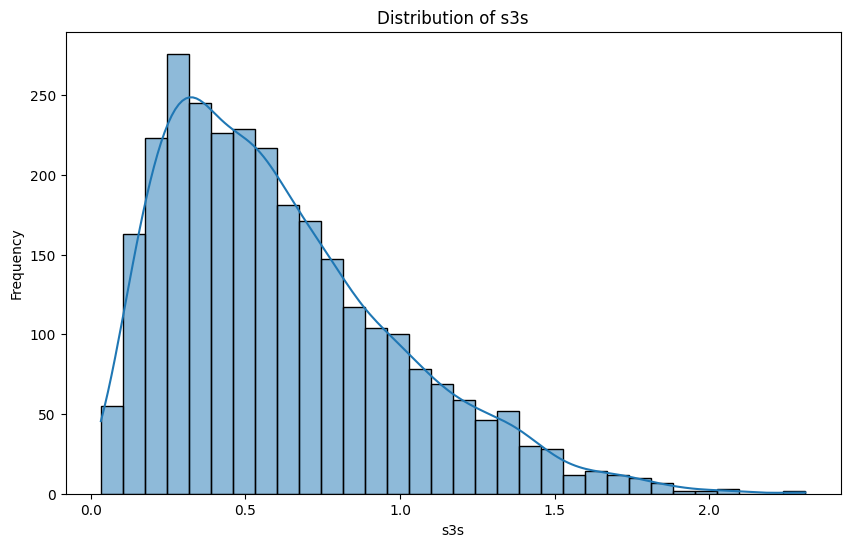


Analysis for column: d1a
Descriptive Statistics:
count    2880.000000
mean      138.157292
std       107.565665
min         1.000000
25%        46.000000
50%       115.000000
75%       187.250000
max       360.000000
Name: d1a, dtype: float64


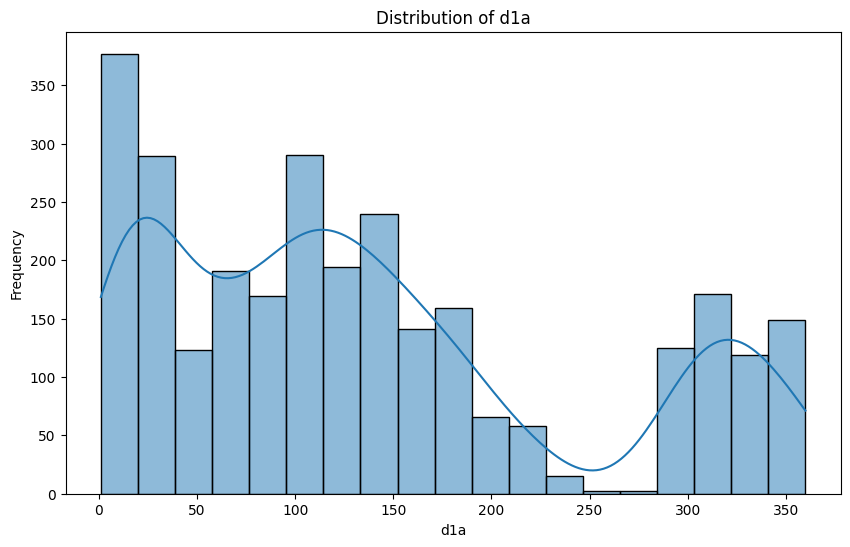


Analysis for column: d1s
Descriptive Statistics:
count    2880.000000
mean        4.826042
std         4.657265
min         0.000000
25%         3.000000
50%         4.000000
75%         6.000000
max        99.000000
Name: d1s, dtype: float64


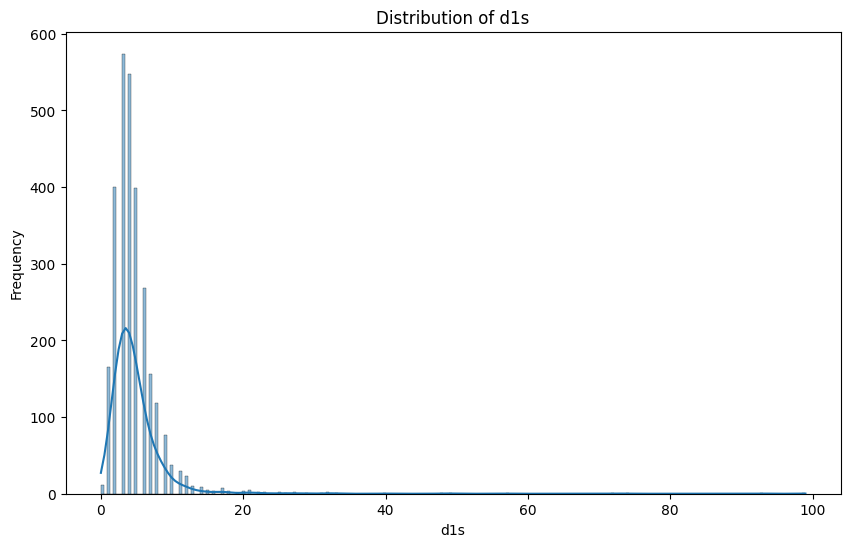


Analysis for column: d2a
Descriptive Statistics:
count    2880.000000
mean      144.624306
std       110.432400
min         1.000000
25%        54.000000
50%       119.500000
75%       209.000000
max       360.000000
Name: d2a, dtype: float64


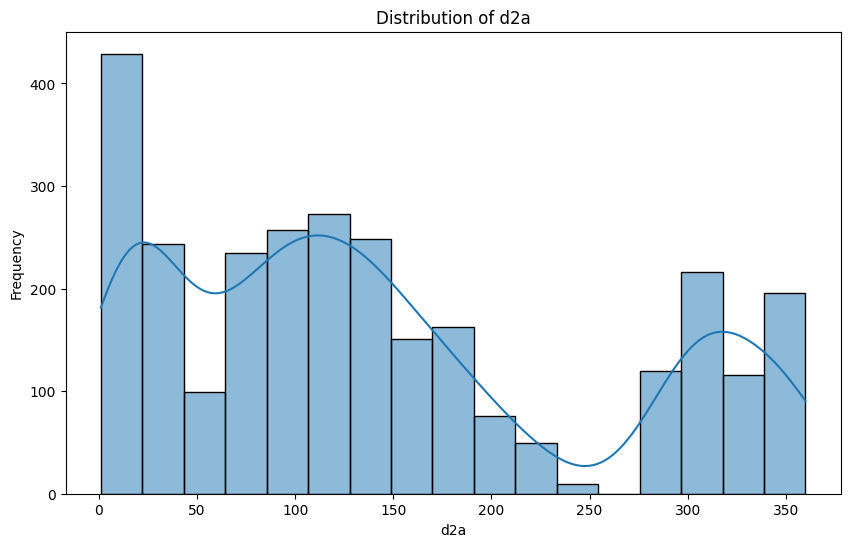


Analysis for column: d2s
Descriptive Statistics:
count    2880.000000
mean        6.123264
std         4.369255
min         0.000000
25%         4.000000
50%         5.000000
75%         7.000000
max        72.000000
Name: d2s, dtype: float64


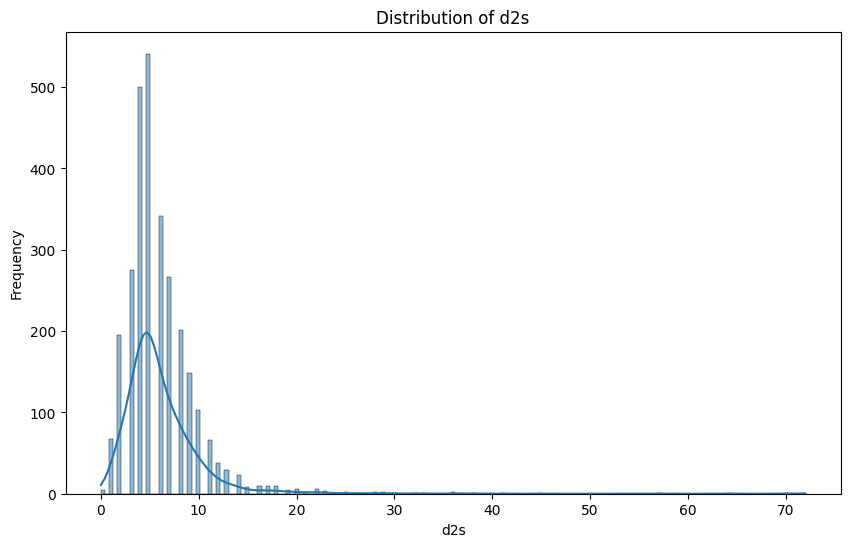


Analysis for column: h1a
Descriptive Statistics:
count    2880.000000
mean       82.243750
std        18.733343
min        26.000000
25%        70.000000
50%        83.000000
75%        99.000000
max       108.000000
Name: h1a, dtype: float64


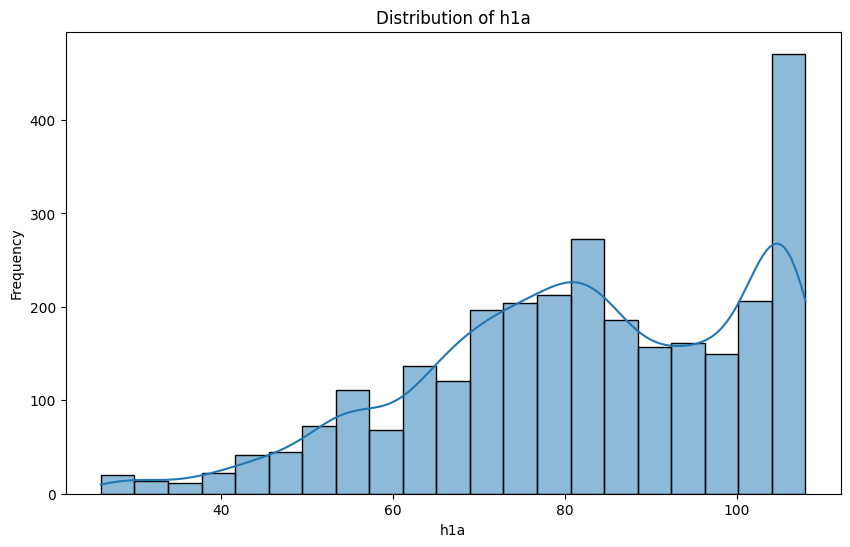


Analysis for column: h1x
Descriptive Statistics:
count    2880.000000
mean       83.015278
std        18.392798
min        26.000000
25%        71.000000
50%        84.000000
75%       100.000000
max       108.000000
Name: h1x, dtype: float64


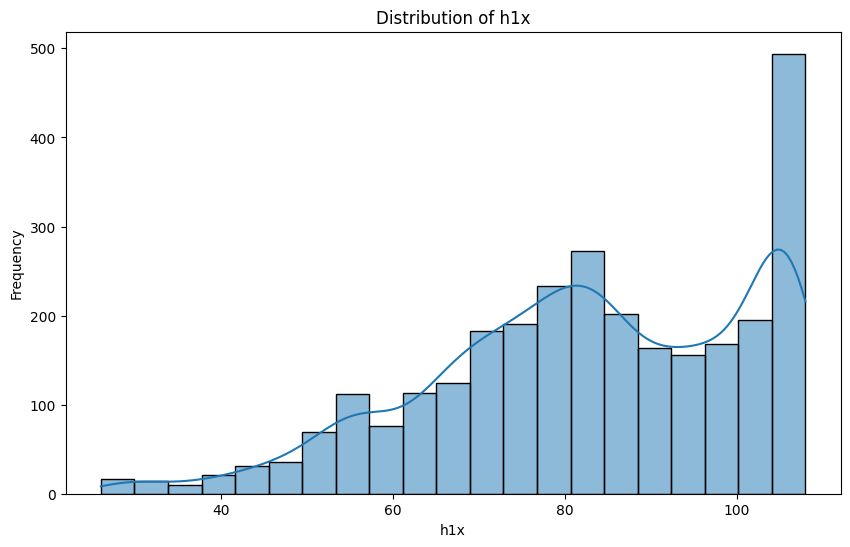


Analysis for column: h1i
Descriptive Statistics:
count    2880.000000
mean       81.478819
std        19.061524
min        26.000000
25%        69.000000
50%        82.000000
75%        99.000000
max       108.000000
Name: h1i, dtype: float64


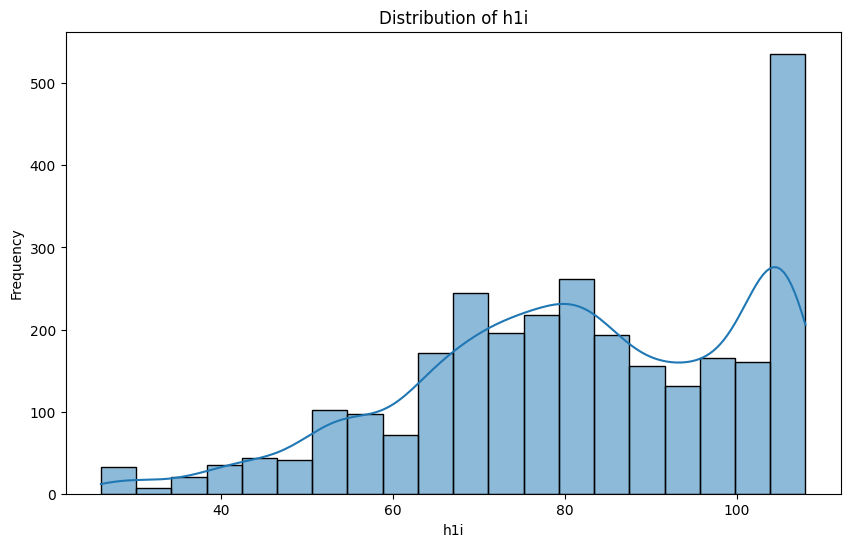


Analysis for column: t1a
Descriptive Statistics:
count    2880.000000
mean        3.891736
std         3.827192
min        -4.750000
25%         1.325000
50%         3.550000
75%         6.750000
max        14.950000
Name: t1a, dtype: float64


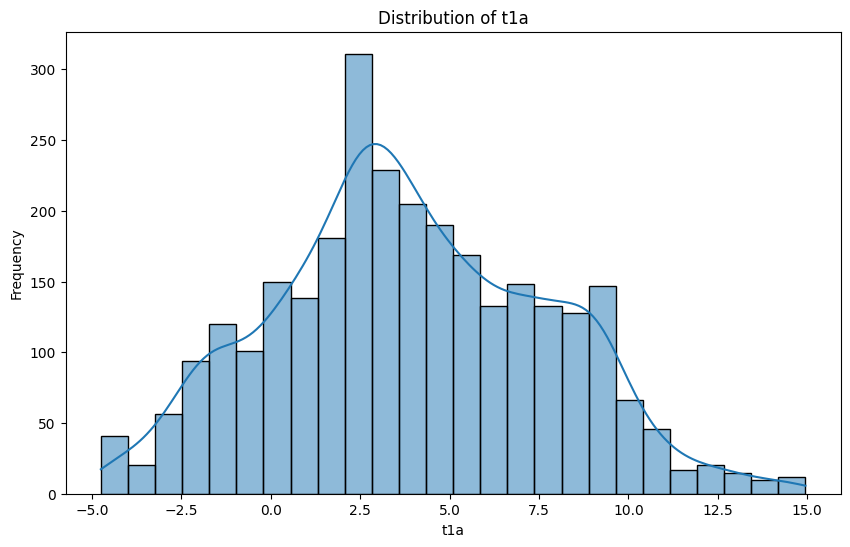


Analysis for column: t1x
Descriptive Statistics:
count    2880.000000
mean        3.993125
std         3.852561
min        -4.650000
25%         1.350000
50%         3.650000
75%         6.850000
max        15.150000
Name: t1x, dtype: float64


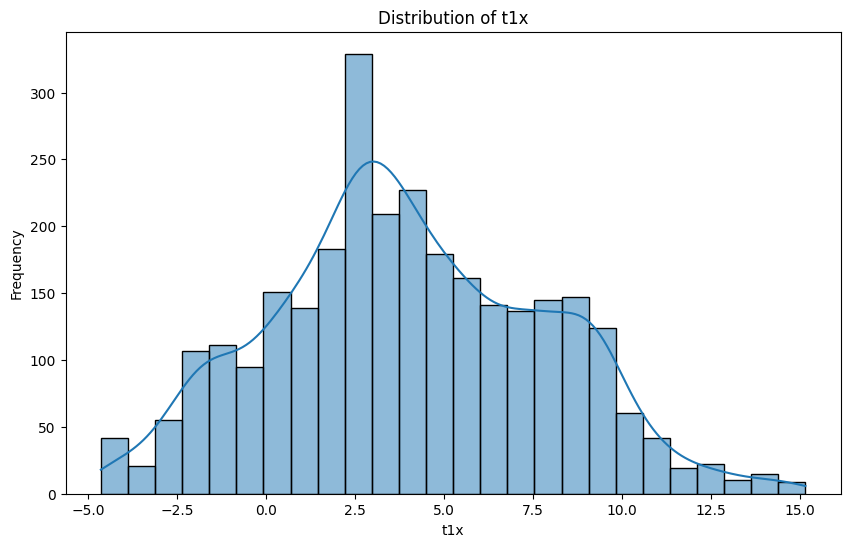


Analysis for column: t1i
Descriptive Statistics:
count    2880.000000
mean        3.791944
std         3.806189
min        -4.750000
25%         1.250000
50%         3.550000
75%         6.650000
max        14.850000
Name: t1i, dtype: float64


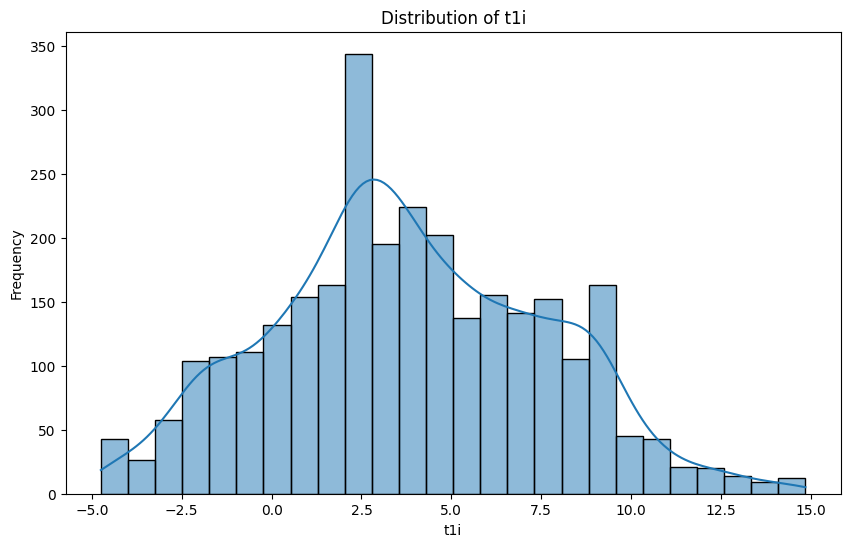


Analysis for column: b1a
Descriptive Statistics:
count    2880.000000
mean     1009.360764
std         8.457773
min       994.000000
25%      1003.000000
50%      1009.000000
75%      1014.000000
max      1032.000000
Name: b1a, dtype: float64


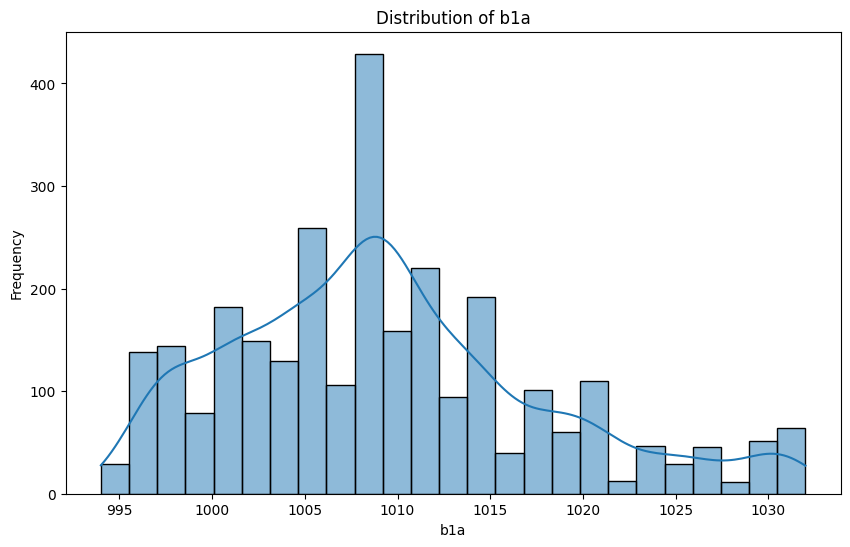


Analysis for column: b1x
Descriptive Statistics:
count    2880.000000
mean     1009.714583
std         8.466787
min       995.000000
25%      1004.000000
50%      1009.000000
75%      1014.000000
max      1032.000000
Name: b1x, dtype: float64


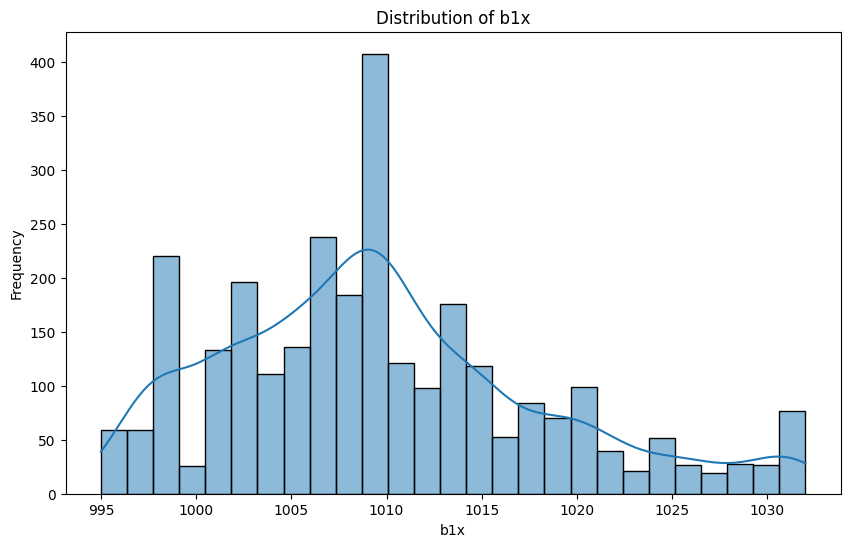


Analysis for column: b1i
Descriptive Statistics:
count    2880.000000
mean     1008.972917
std         8.439020
min       994.000000
25%      1003.000000
50%      1008.000000
75%      1014.000000
max      1031.000000
Name: b1i, dtype: float64


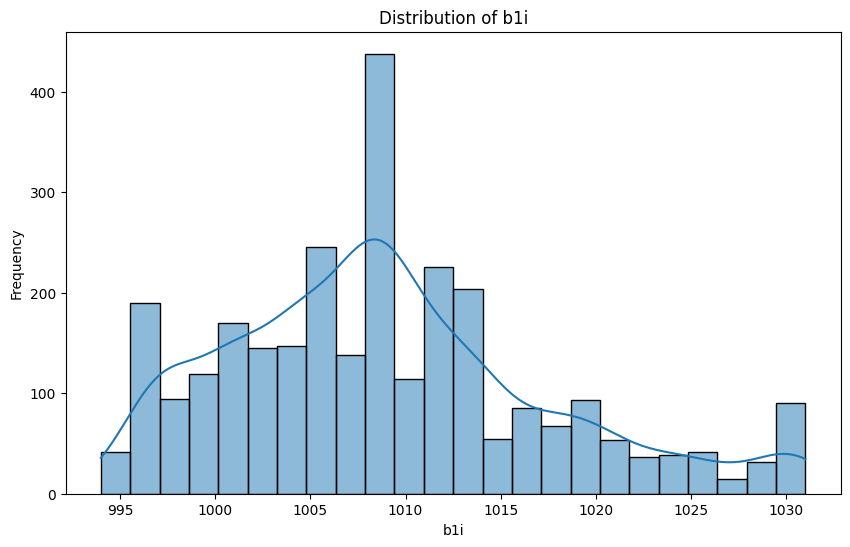


Analysis for column: p1a
Descriptive Statistics:
count    2880.000000
mean        6.737997
std         3.123012
min         0.241760
25%         4.386590
50%         6.543840
75%         8.783610
max        17.366730
Name: p1a, dtype: float64


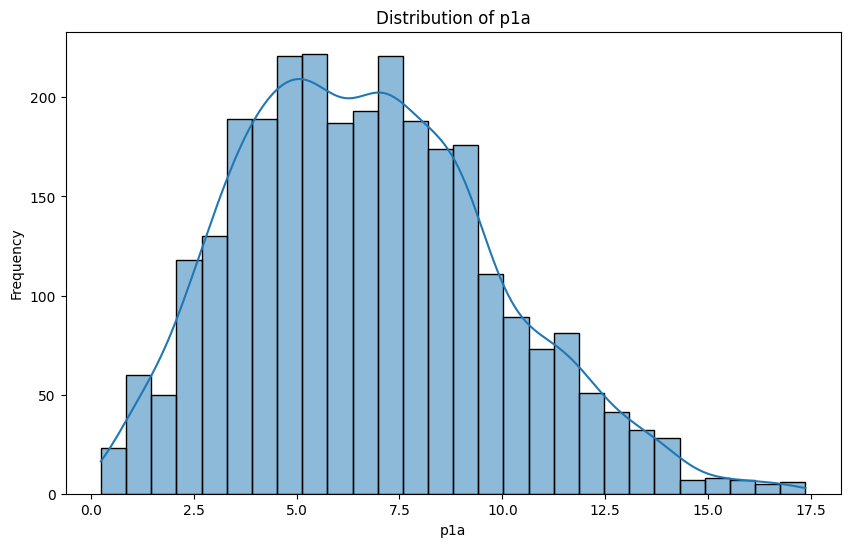


Analysis for column: p1x
Descriptive Statistics:
count    2880.000000
mean        8.445514
std         3.992934
min         0.319700
25%         5.500750
50%         7.976650
75%        11.048600
max        21.639950
Name: p1x, dtype: float64


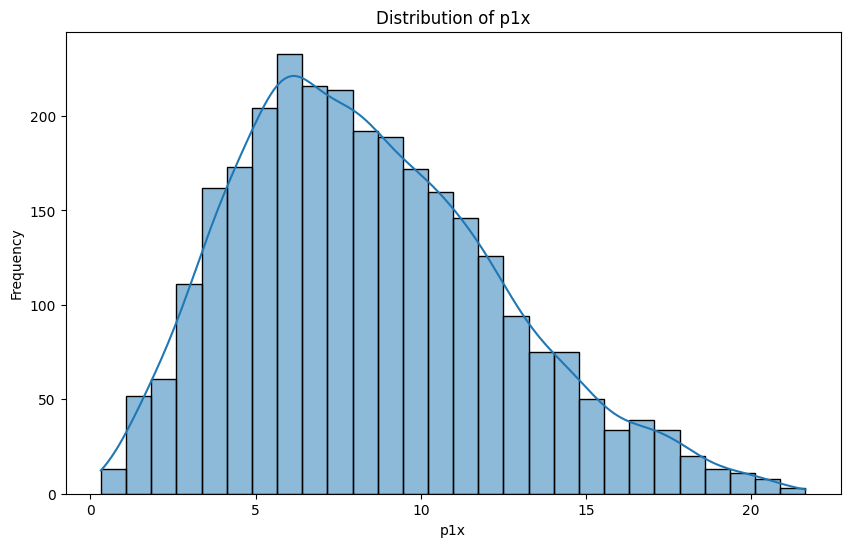


Analysis for column: p1i
Descriptive Statistics:
count    2880.000000
mean        4.894591
std         2.228902
min         0.228000
25%         3.254100
50%         4.858850
75%         6.463600
max        12.836750
Name: p1i, dtype: float64


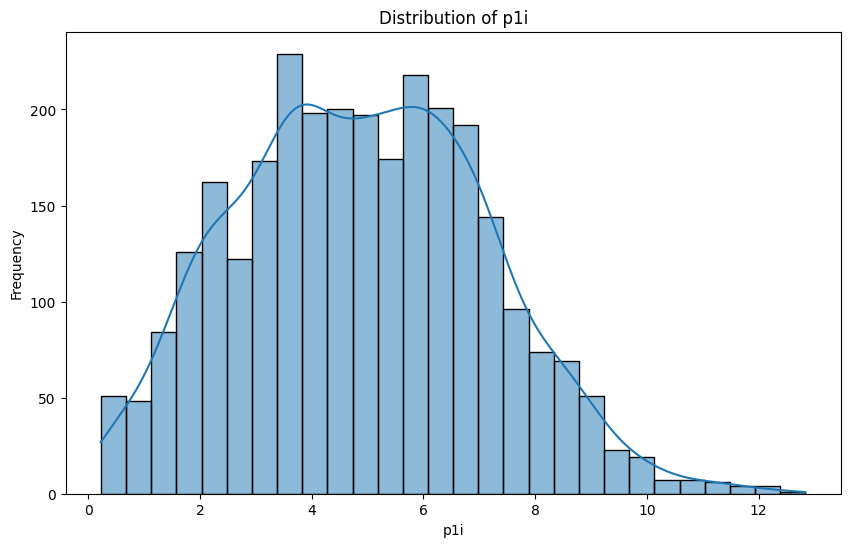


Analysis for column: p1s
Descriptive Statistics:
count    2880.000000
mean        0.662371
std         0.407591
min         0.022930
25%         0.342732
50%         0.586880
75%         0.898660
max         2.338350
Name: p1s, dtype: float64


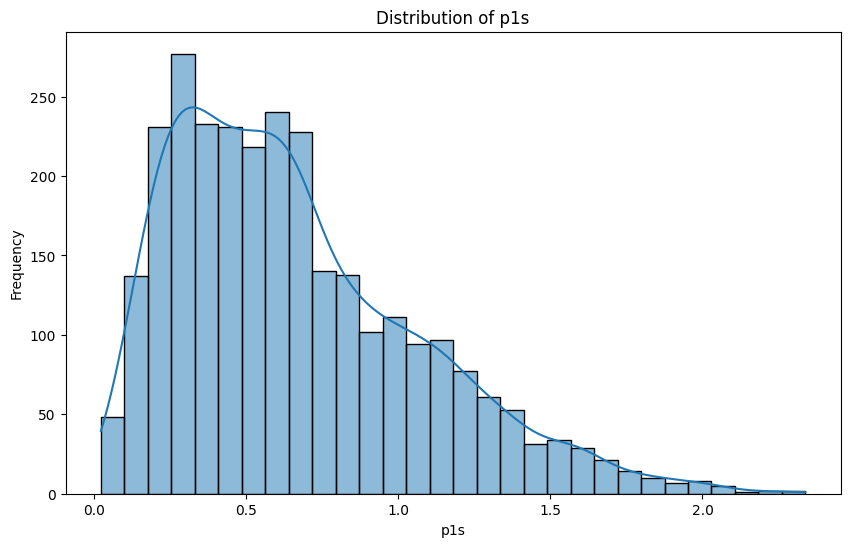


Analysis for column: tia
Descriptive Statistics:
count    2880.000000
mean       44.118750
std         4.632346
min        31.000000
25%        41.000000
50%        45.000000
75%        47.000000
max        56.000000
Name: tia, dtype: float64


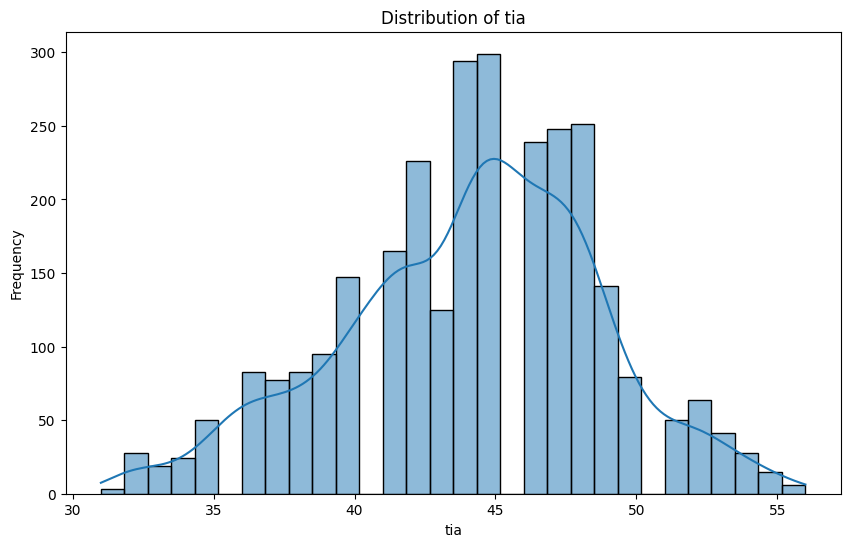


Analysis for column: tix
Descriptive Statistics:
count    2880.000000
mean       44.184028
std         4.624431
min        31.000000
25%        41.000000
50%        45.000000
75%        47.000000
max        56.000000
Name: tix, dtype: float64


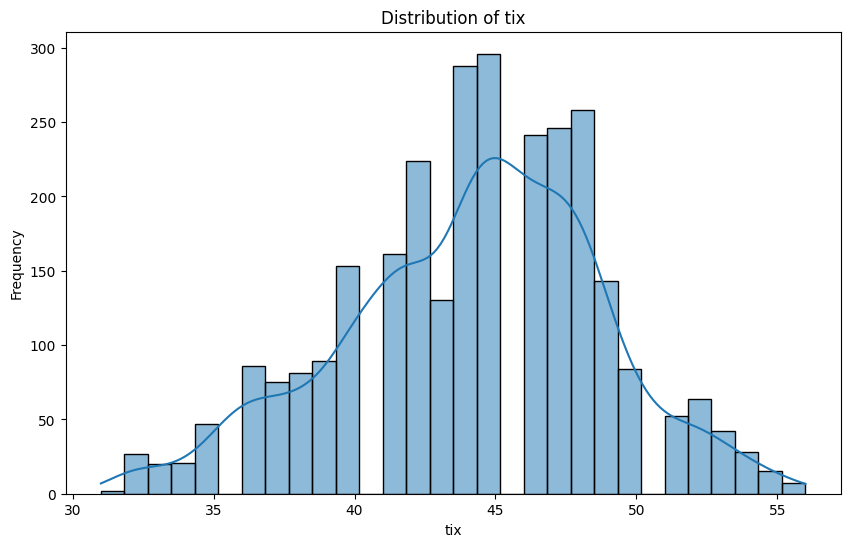


Analysis for column: tii
Descriptive Statistics:
count    2880.000000
mean       44.056597
std         4.625232
min        31.000000
25%        41.000000
50%        44.500000
75%        47.000000
max        56.000000
Name: tii, dtype: float64


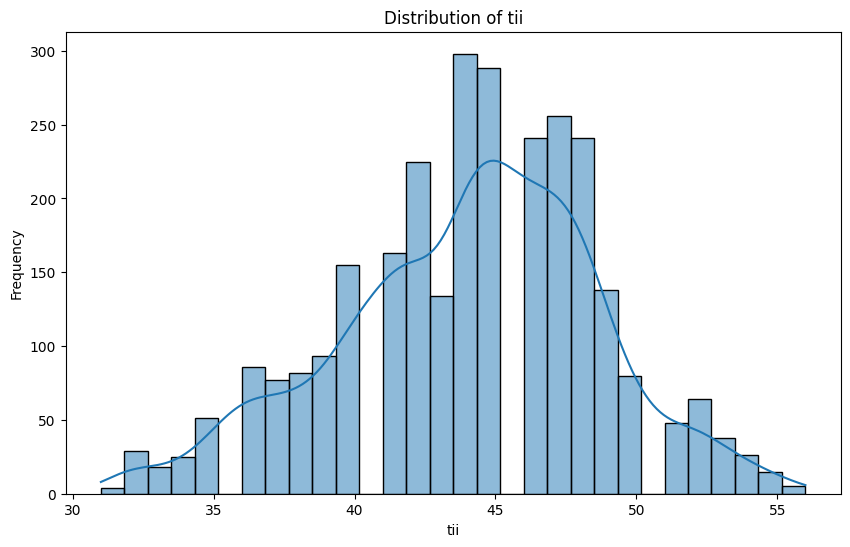


Analysis for column: vxa
Descriptive Statistics:
count    2880.000000
mean      130.323958
std         5.668838
min       124.000000
25%       126.000000
50%       127.000000
75%       137.000000
max       145.000000
Name: vxa, dtype: float64


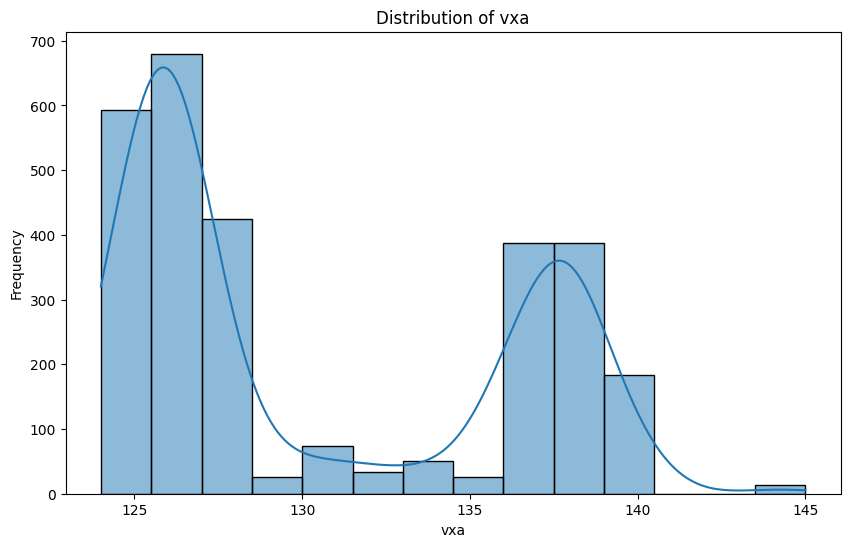


Analysis for column: vxx
Descriptive Statistics:
count    2880.000000
mean      130.713889
std         5.968082
min       124.000000
25%       126.000000
50%       127.000000
75%       138.000000
max       146.000000
Name: vxx, dtype: float64


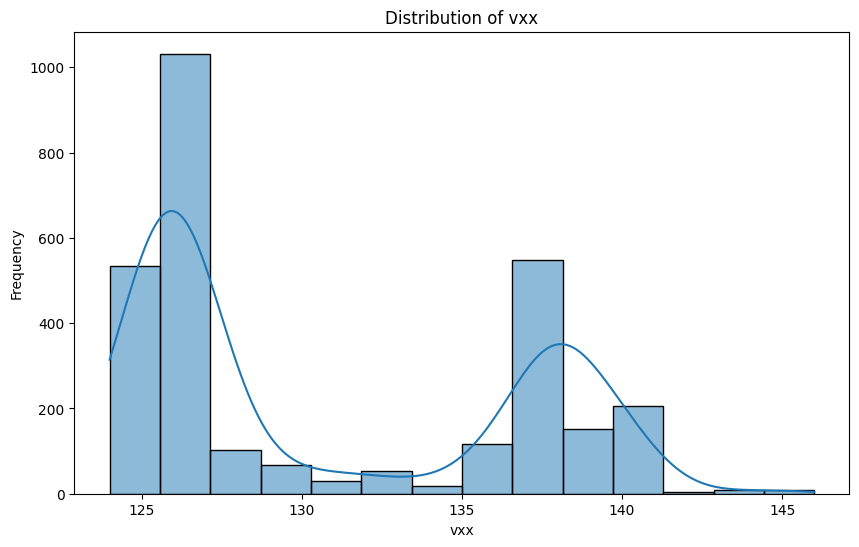


Analysis for column: vxi
Descriptive Statistics:
count    2880.000000
mean      129.964583
std         5.433752
min       124.000000
25%       126.000000
50%       127.000000
75%       136.000000
max       144.000000
Name: vxi, dtype: float64


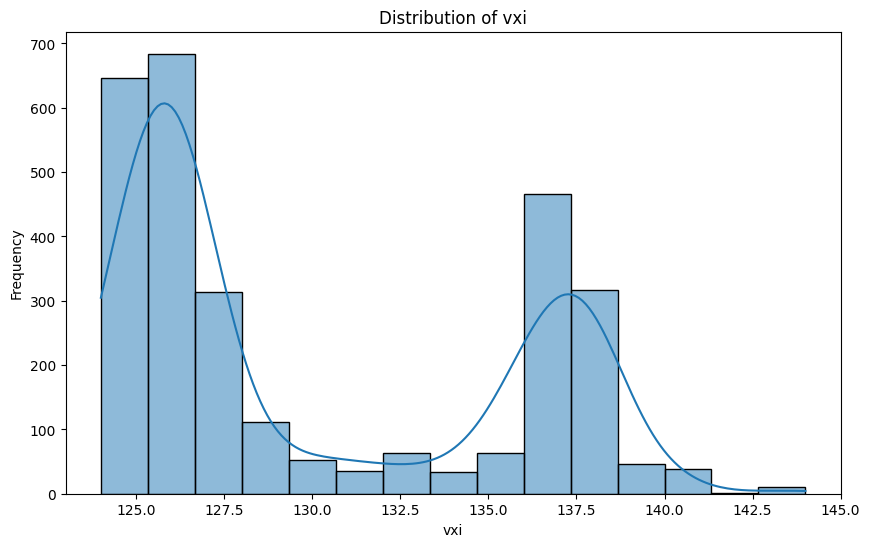


Analysis for column: bla
Descriptive Statistics:
count    2880.0
mean       83.0
std         0.0
min        83.0
25%        83.0
50%        83.0
75%        83.0
max        83.0
Name: bla, dtype: float64


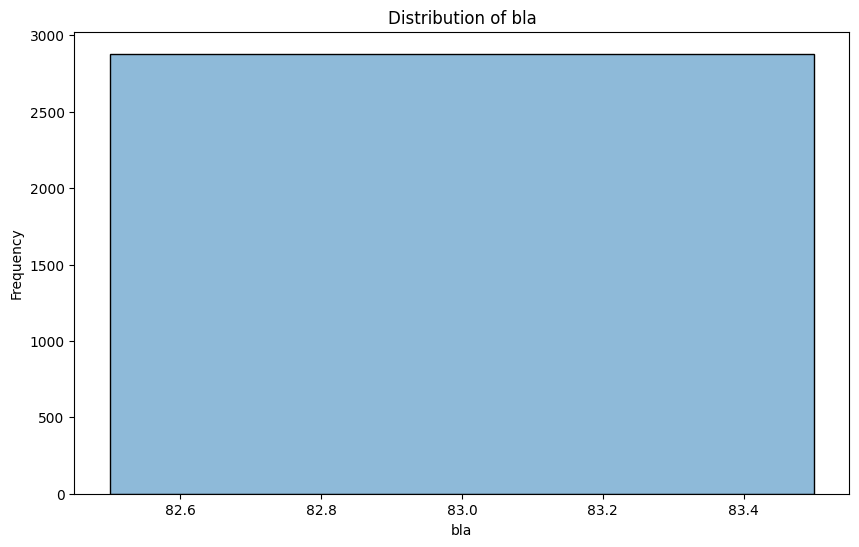


Analysis for column: blx
Descriptive Statistics:
count    2880.0
mean       83.0
std         0.0
min        83.0
25%        83.0
50%        83.0
75%        83.0
max        83.0
Name: blx, dtype: float64


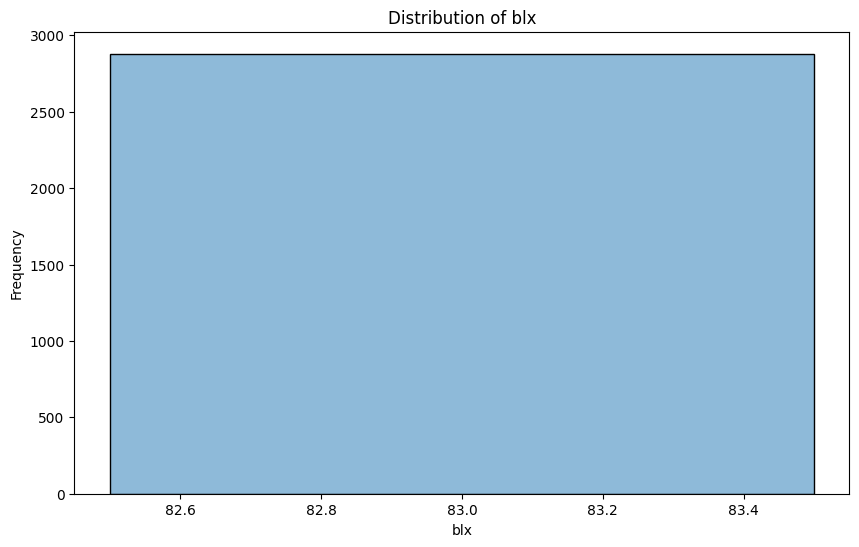


Analysis for column: bli
Descriptive Statistics:
count    2880.000000
mean       82.985417
std         0.119899
min        82.000000
25%        83.000000
50%        83.000000
75%        83.000000
max        83.000000
Name: bli, dtype: float64


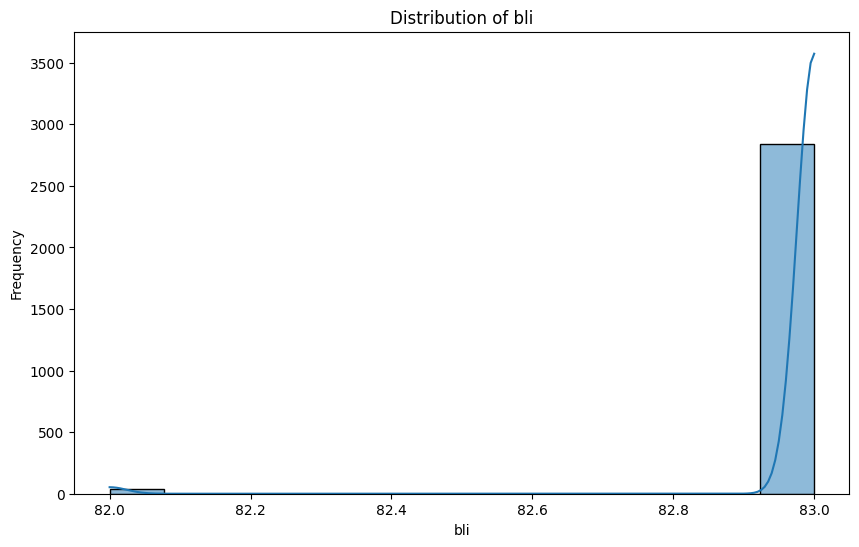


Analysis for column: bra
Descriptive Statistics:
count    2880.0
mean       83.0
std         0.0
min        83.0
25%        83.0
50%        83.0
75%        83.0
max        83.0
Name: bra, dtype: float64


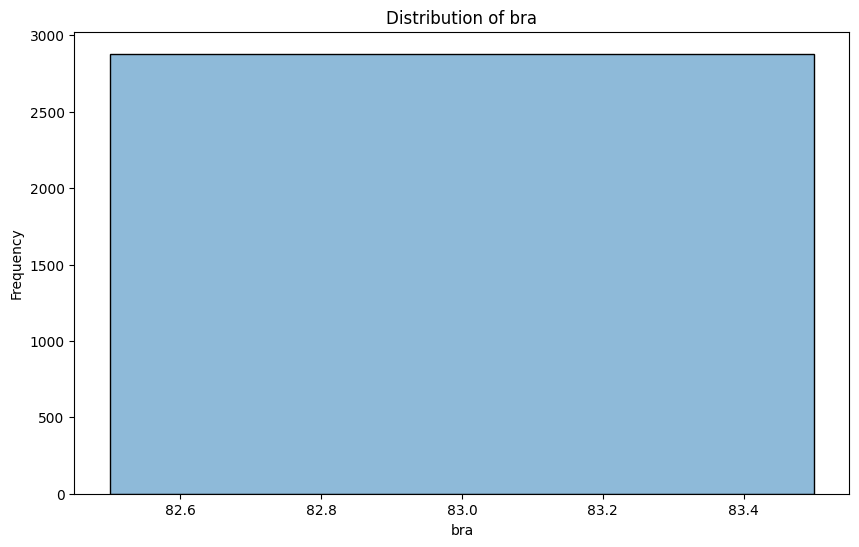


Analysis for column: brx
Descriptive Statistics:
count    2880.000000
mean       83.001389
std         0.058919
min        83.000000
25%        83.000000
50%        83.000000
75%        83.000000
max        86.000000
Name: brx, dtype: float64


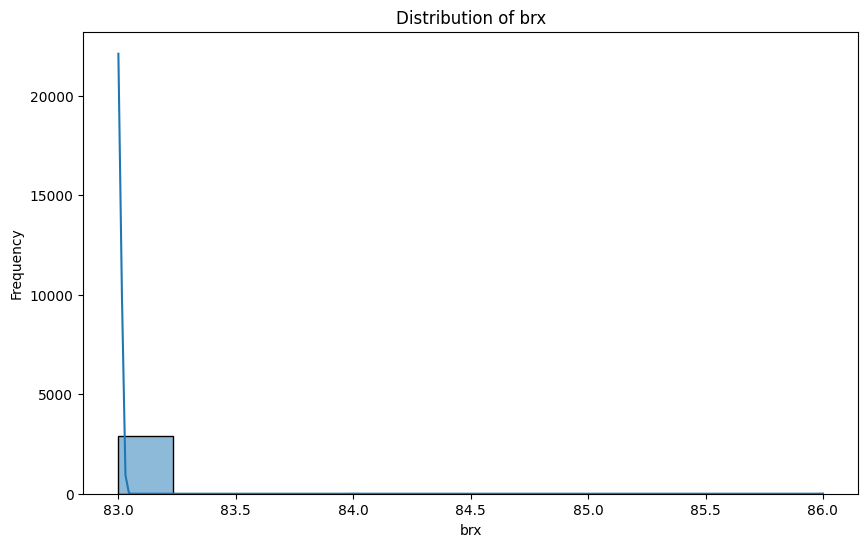


Analysis for column: bri
Descriptive Statistics:
count    2880.0
mean       83.0
std         0.0
min        83.0
25%        83.0
50%        83.0
75%        83.0
max        83.0
Name: bri, dtype: float64


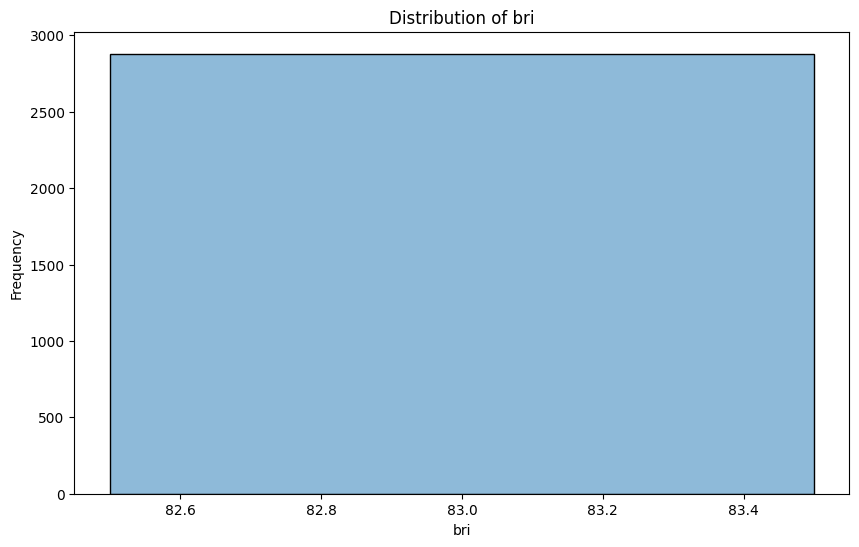

In [50]:
# Perform Statistical data analysis for each column
for column in combined_df.columns:
    if column not in ['date', 'time', 'period']:
        print("\nAnalysis for column:", column)
        print("Descriptive Statistics:")
        print(combined_df[column].describe())
        
        plt.figure(figsize=(10, 6))
        sns.histplot(combined_df[column], kde=True)
        plt.title(f'Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.show() 

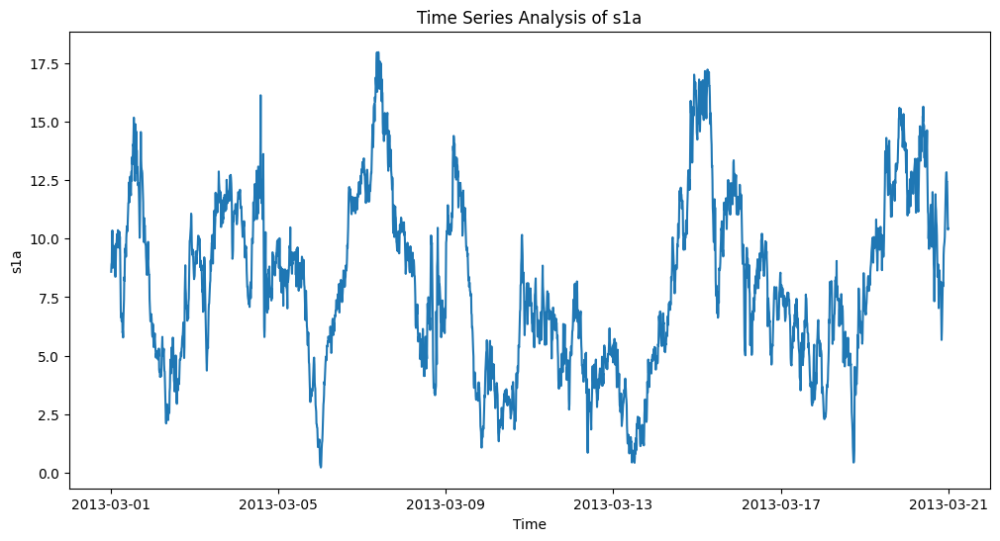

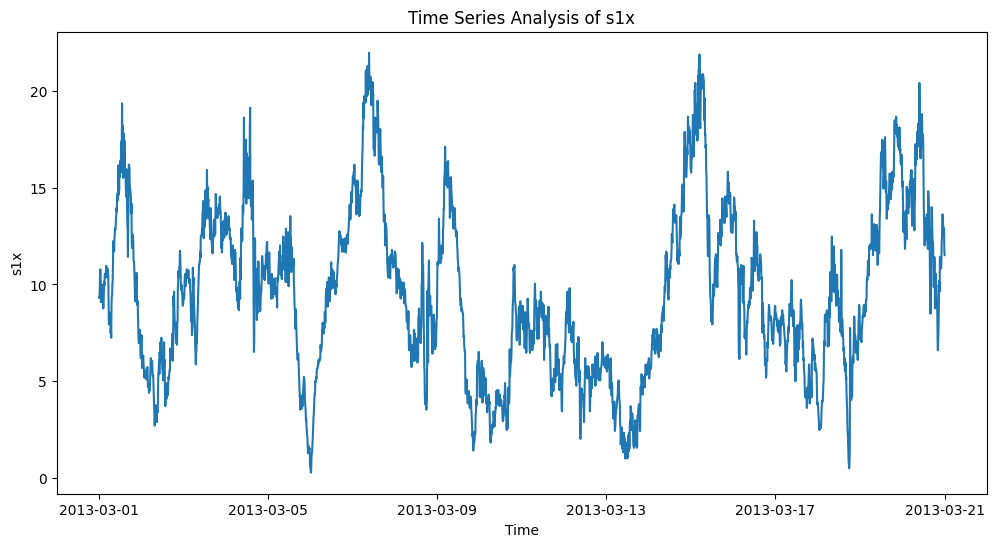

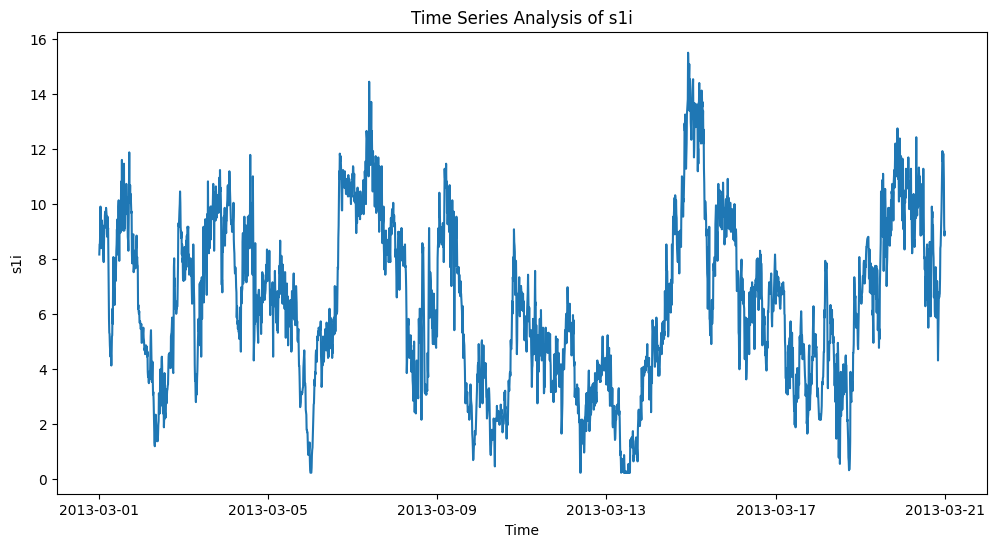

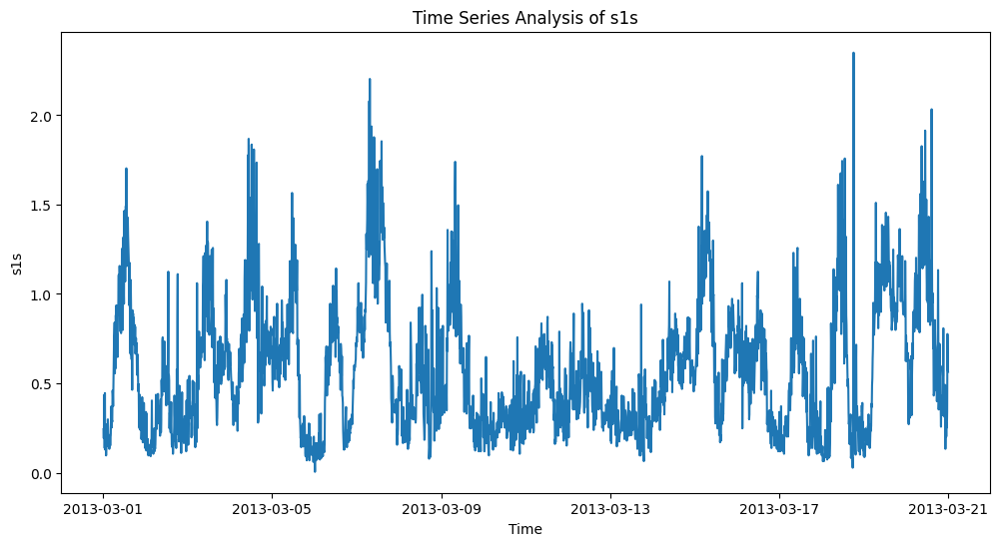

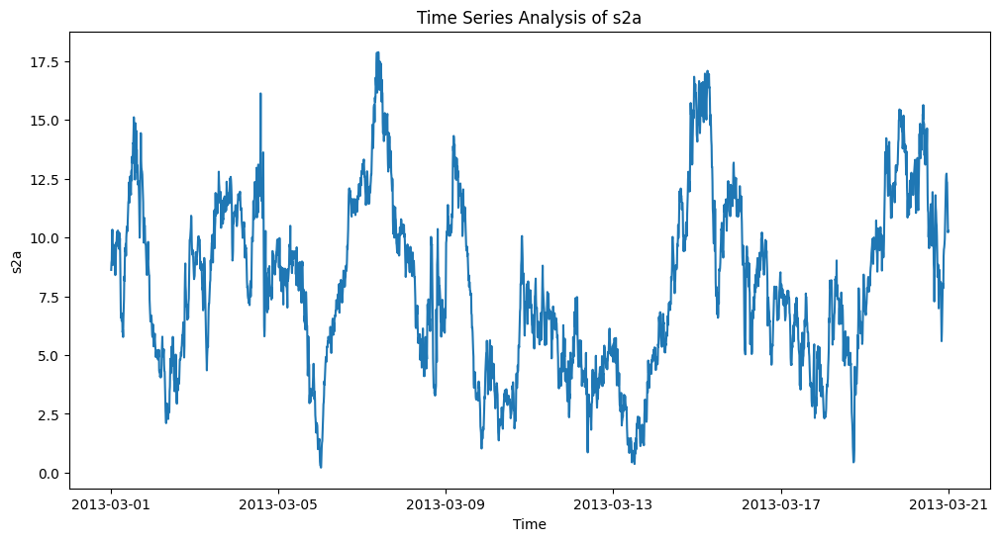

...

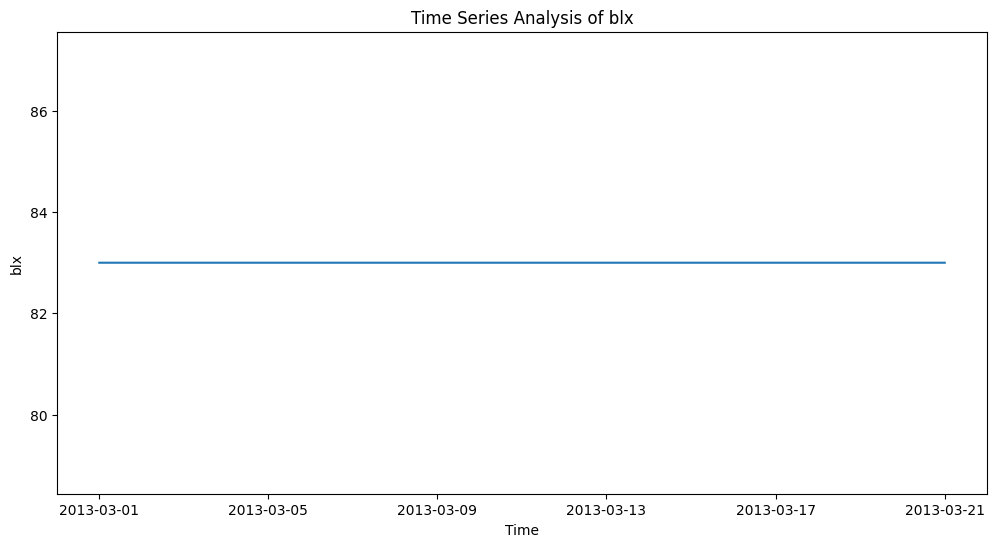

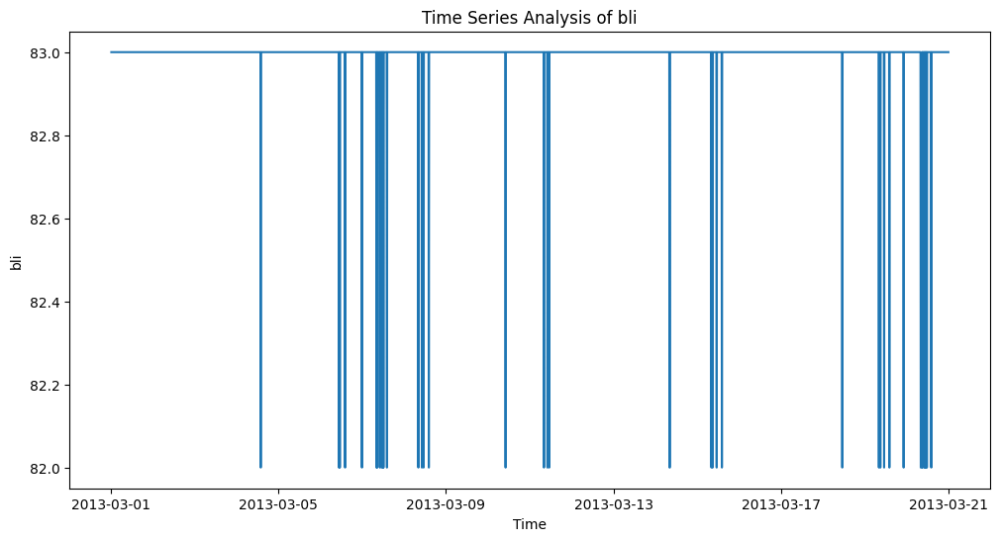

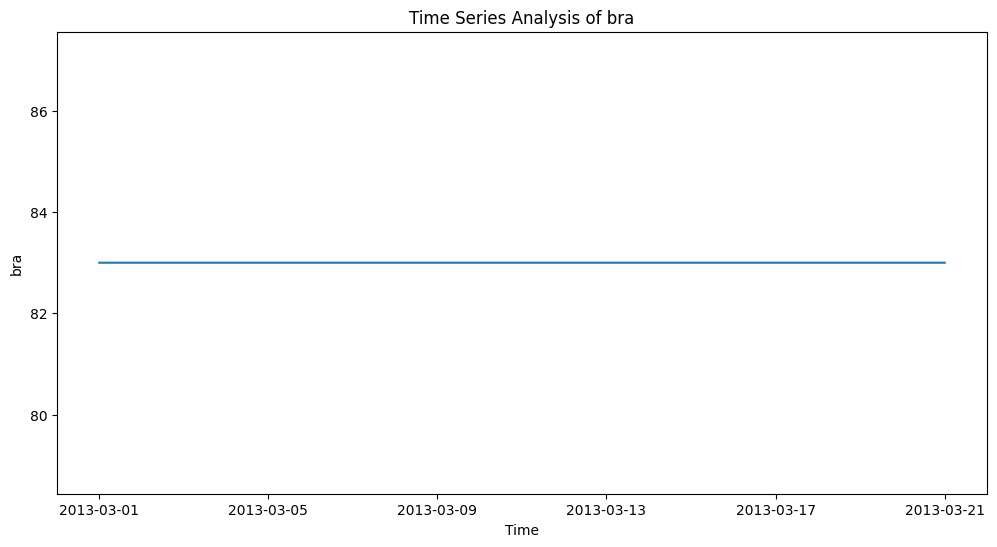

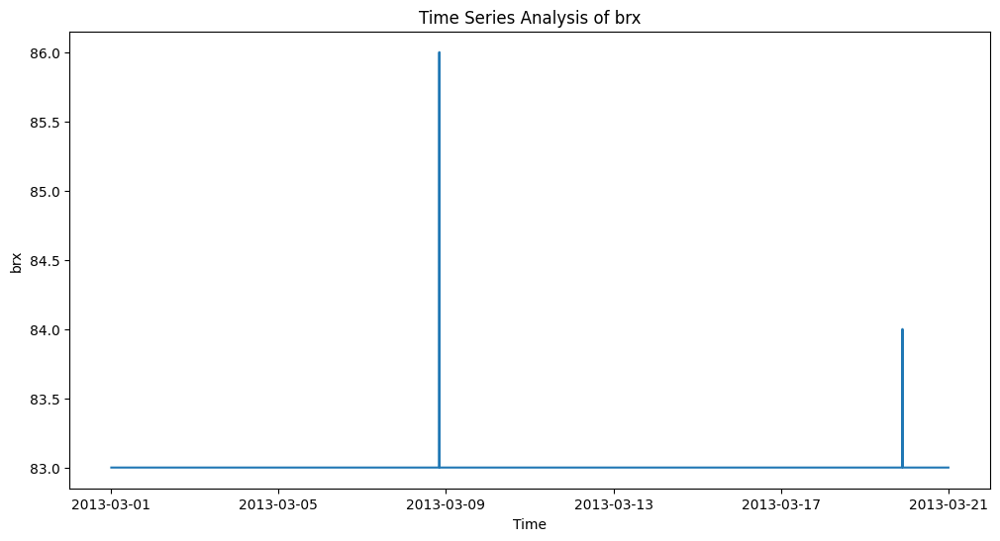

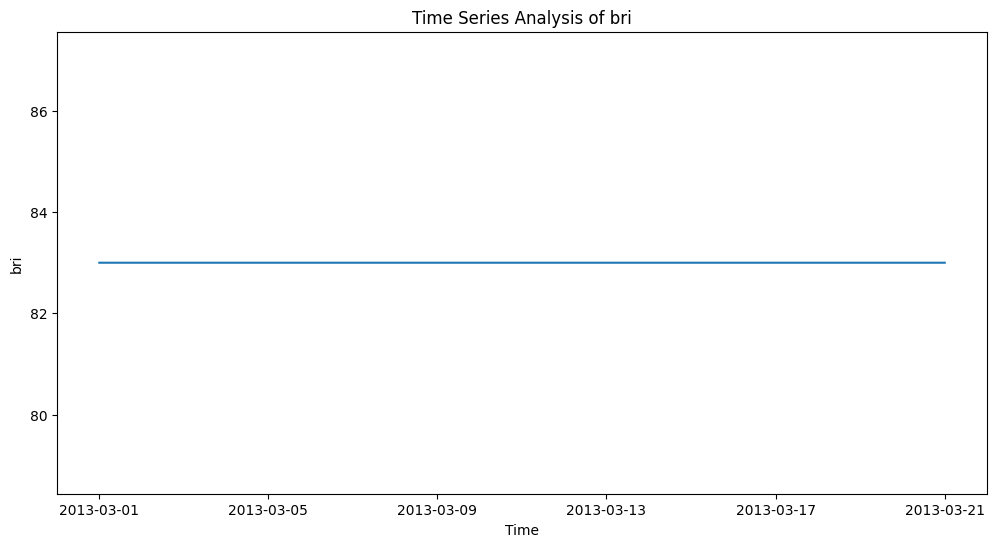

In [51]:
# Perform time series analysis for each column
for column in combined_df.columns:
    if column not in ['date', 'time', 'period']:
        plt.figure(figsize=(12, 6))
        sns.lineplot(x=combined_df.index, y=combined_df[column])
        plt.title(f'Time Series Analysis of {column}')
        plt.xlabel('Time')
        plt.ylabel(column)
        plt.show()

In [52]:
# Exclude columns from correlation analysis
columns_to_exclude = ['datetime', 'date', 'time', 'period']
columns_for_correlation = [col for col in combined_df.columns if col not in columns_to_exclude]

# Calculate correlation matrix
correlation_matrix = combined_df[columns_for_correlation].corr()
#print(correlation_matrix)

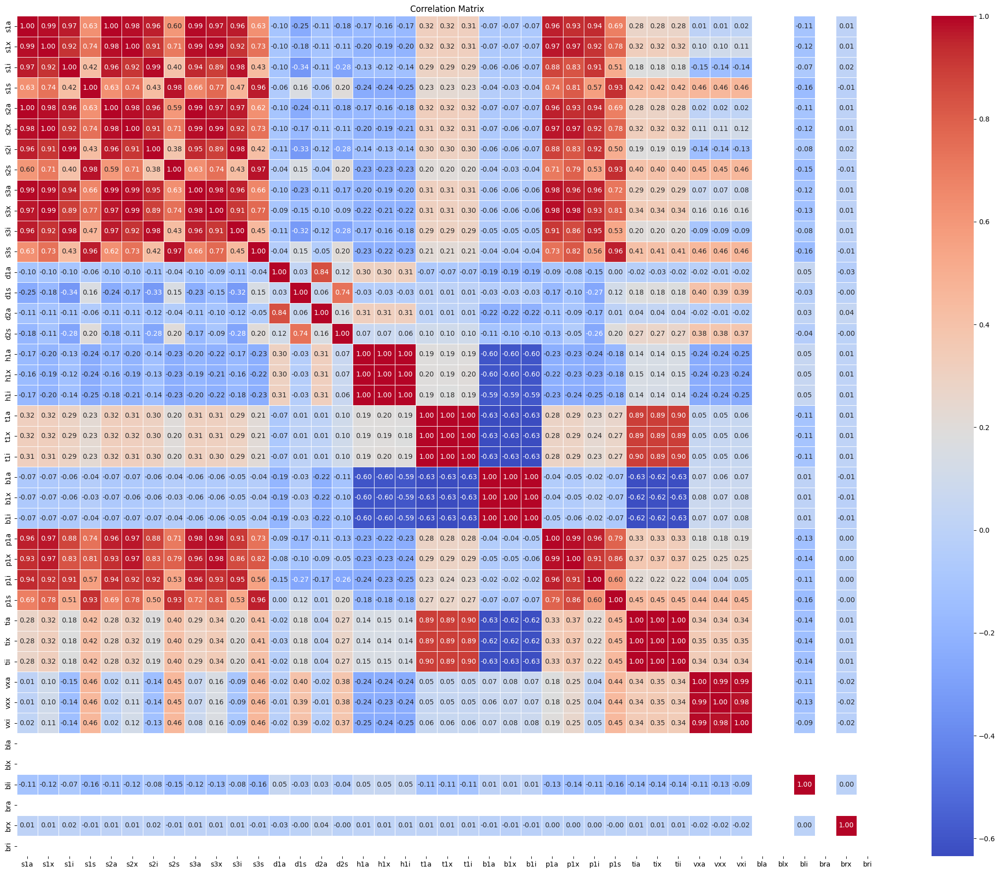

In [53]:
# Create a heatmap for the correlation matrix
#  The heatmap displays the correlation coefficients between different columns. 
# Positive values indicate a positive correlation, while negative values indicate a negative correlation. 
# Values closer to 1 or -1 indicate stronger correlations.
plt.figure(figsize=(28, 22))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

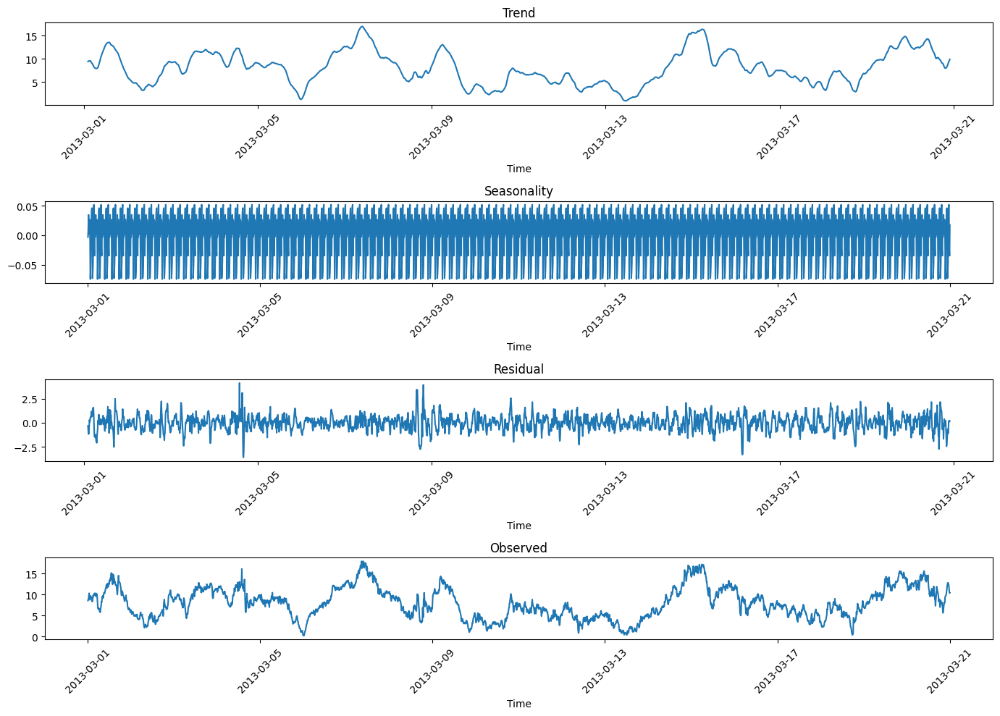

In [54]:
# Decompose the time series into trend, seasonality, and residual components for 's1a'
result = seasonal_decompose(combined_df['s1a'], model='additive', period=24)
plt.figure(figsize=(14, 10))
plt.subplot(4, 1, 1)
plt.plot(result.trend)
plt.title('Trend')
plt.xlabel('Time')
plt.xticks(rotation=45)

plt.subplot(4, 1, 2)
plt.plot(result.seasonal)
plt.title('Seasonality')
plt.xlabel('Time')
plt.xticks(rotation=45)

plt.subplot(4, 1, 3)
plt.plot(result.resid)
plt.title('Residual')
plt.xlabel('Time')
plt.xticks(rotation=45)

plt.subplot(4, 1, 4)
plt.plot(result.observed)
plt.title('Observed')
plt.xlabel('Time')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

/Users/mpillodi/anaconda3/envs/windanalysis/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10T will be used.
  self._init_dates(dates, freq)
/Users/mpillodi/anaconda3/envs/windanalysis/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10T will be used.
  self._init_dates(dates, freq)


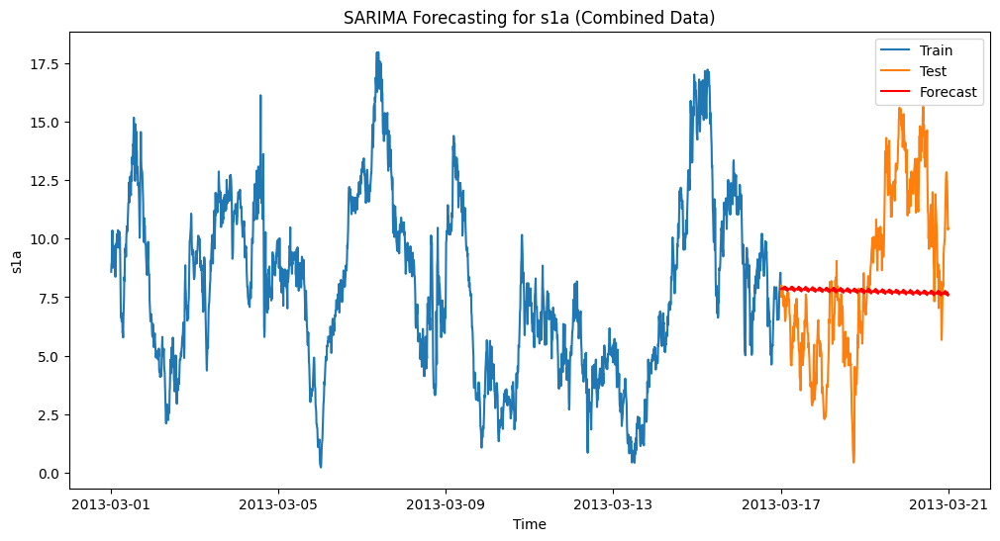

In [55]:
# Forecasting using SARIMA (Seasonal AutoRegressive Integrated Moving Average) for 's1a'
train_size = int(len(combined_df['s1a']) * 0.8)
train, test = combined_df['s1a'][:train_size], combined_df['s1a'][train_size:]

model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 24))
fit_model = model.fit(disp=False)

forecast = fit_model.get_forecast(steps=len(test))
predicted_values = forecast.predicted_mean

plt.figure(figsize=(12, 6))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, predicted_values, label='Forecast', color='red')
plt.title('SARIMA Forecasting for s1a (Combined Data)')
plt.xlabel('Time')
plt.ylabel('s1a')
plt.legend()
plt.show()

/Users/mpillodi/anaconda3/envs/windanalysis/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10T will be used.
  self._init_dates(dates, freq)
/Users/mpillodi/anaconda3/envs/windanalysis/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10T will be used.
  self._init_dates(dates, freq)


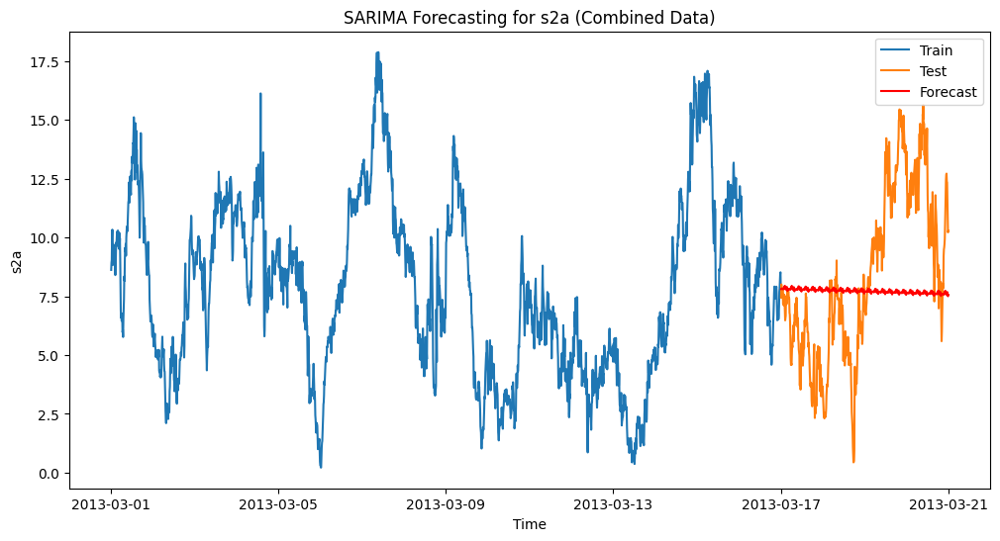

In [56]:
# Forecasting using SARIMA (Seasonal AutoRegressive Integrated Moving Average) for 's1a'
train_size = int(len(combined_df['s2a']) * 0.8)
train, test = combined_df['s2a'][:train_size], combined_df['s2a'][train_size:]

model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 24))
fit_model = model.fit(disp=False)

forecast = fit_model.get_forecast(steps=len(test))
predicted_values = forecast.predicted_mean

plt.figure(figsize=(12, 6))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, predicted_values, label='Forecast', color='red')
plt.title('SARIMA Forecasting for s2a (Combined Data)')
plt.xlabel('Time')
plt.ylabel('s2a')
plt.legend()
plt.show()

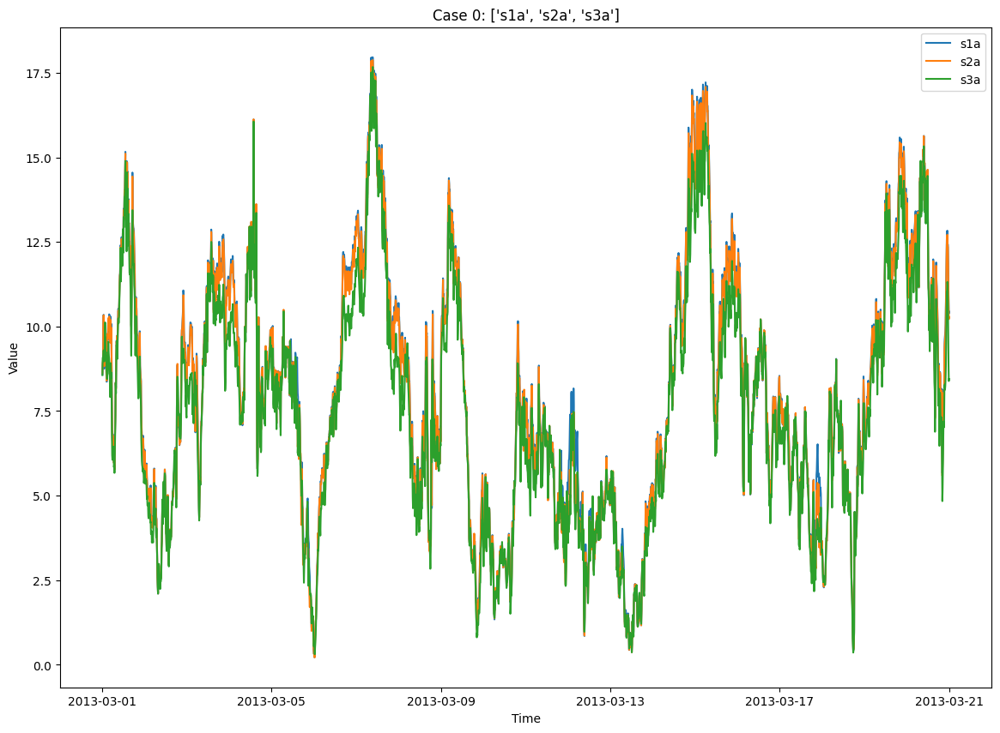

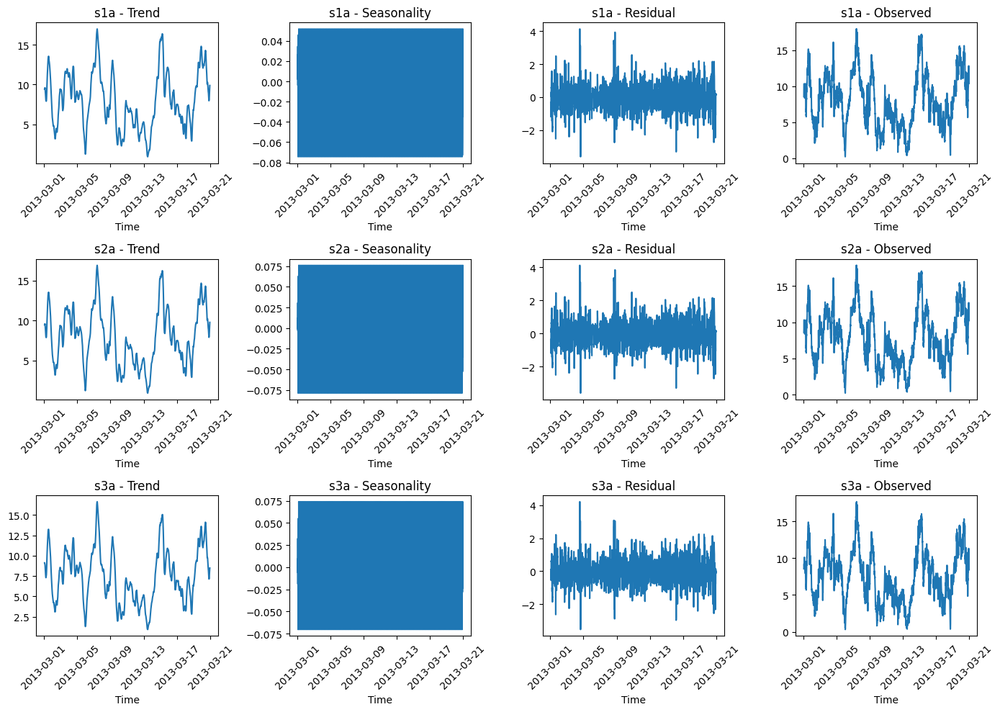

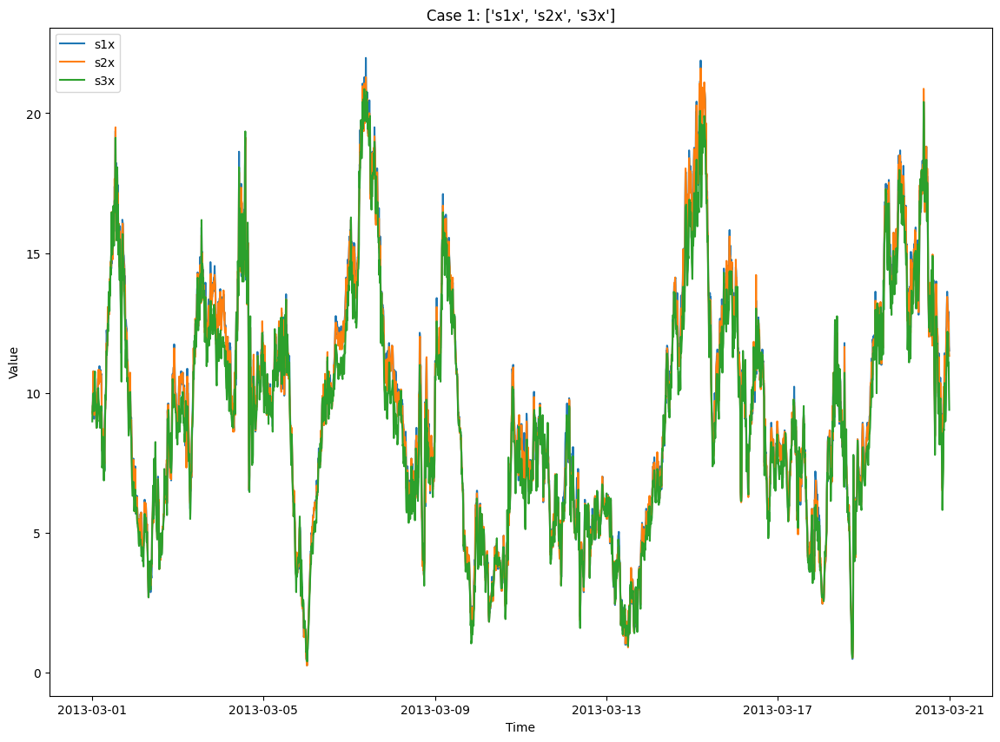

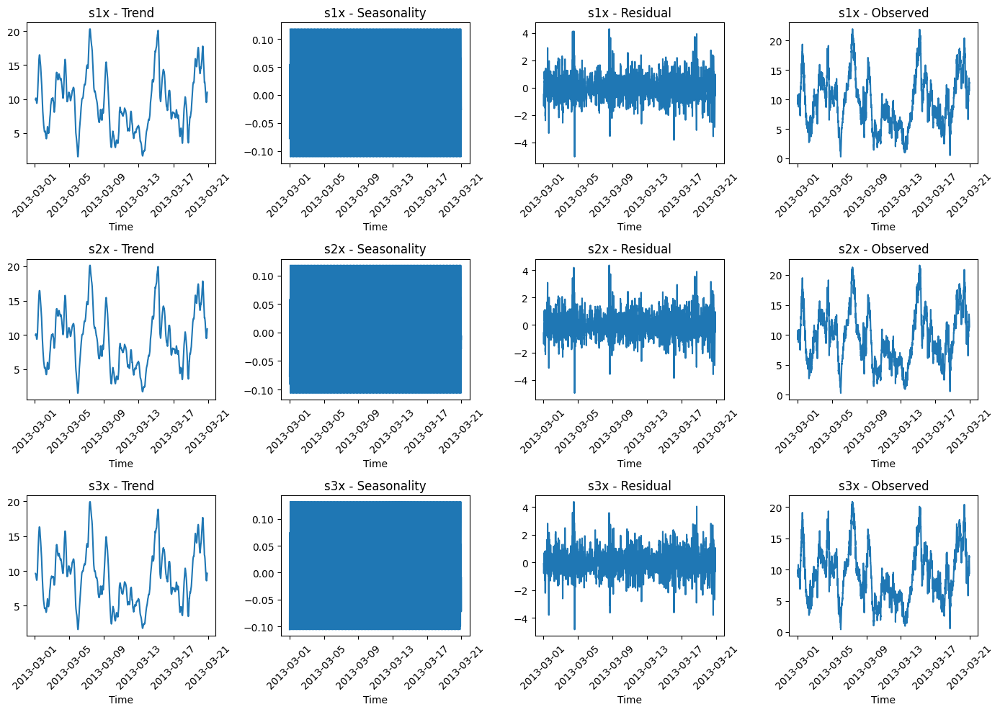

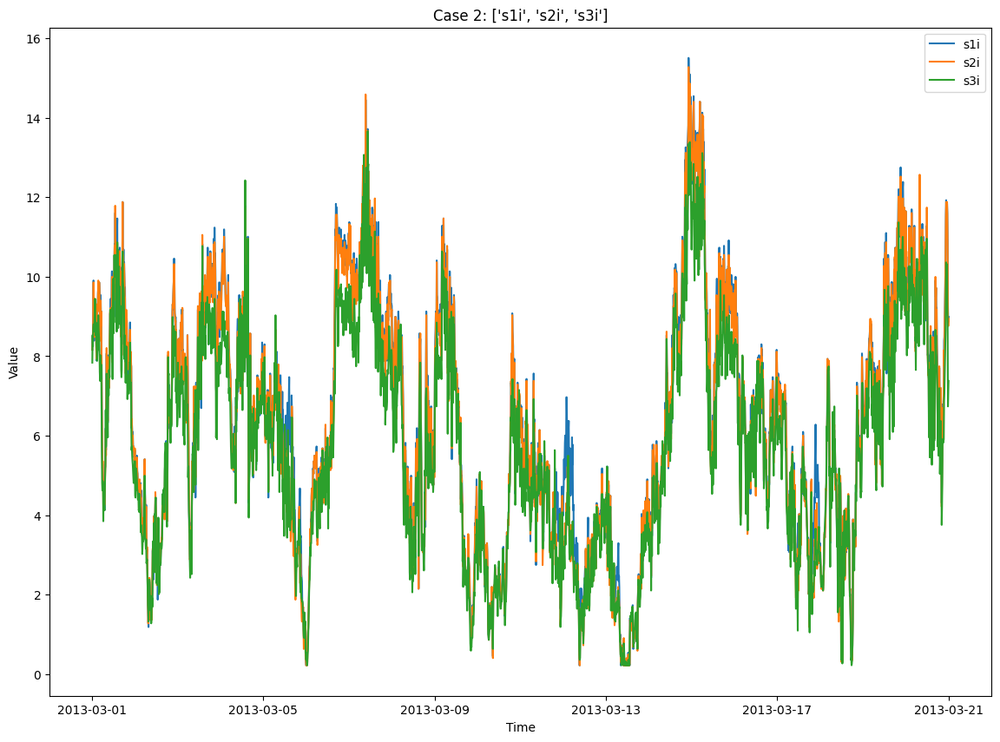

...

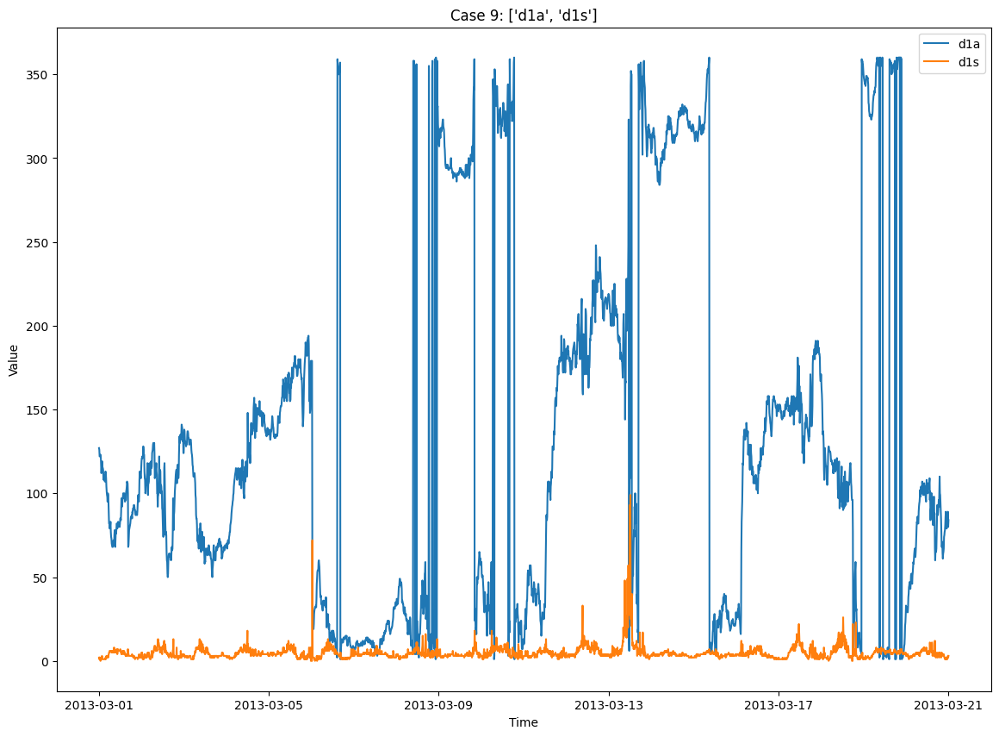

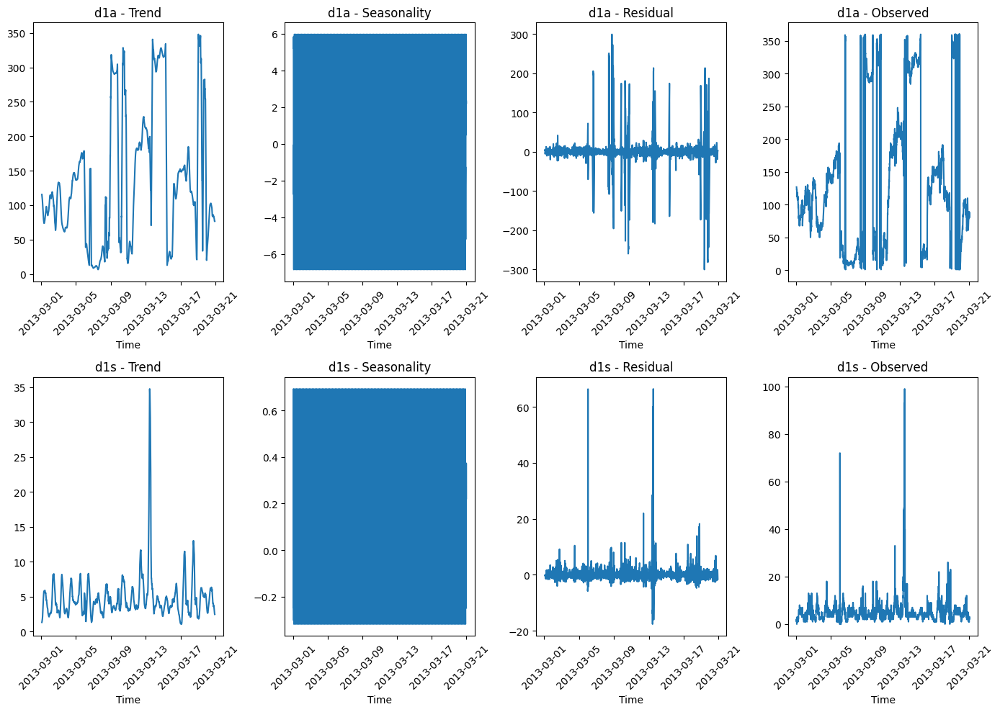

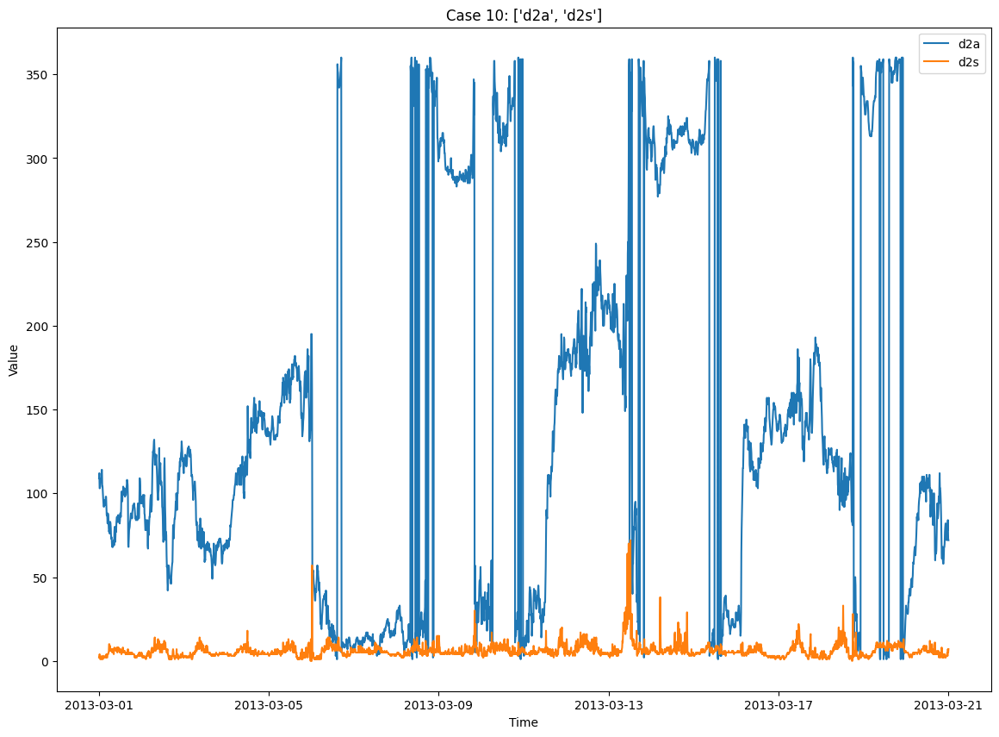

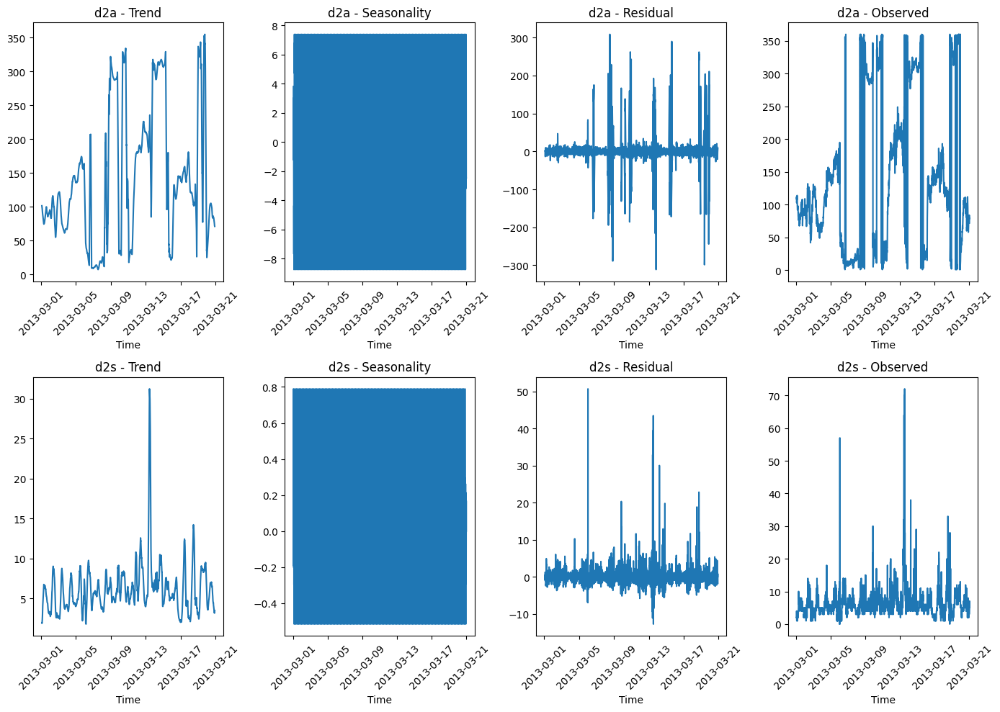

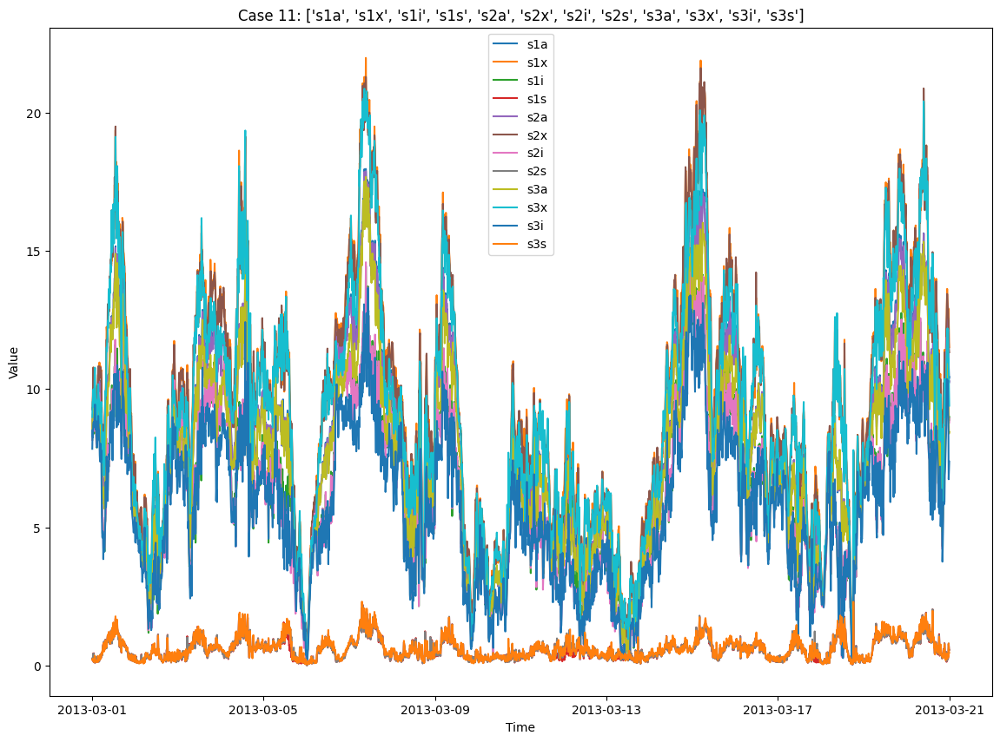

/var/folders/cm/z0rxfl150998whdyb59p7fyjklw33n/T/ipykernel_81058/2652460367.py:70: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


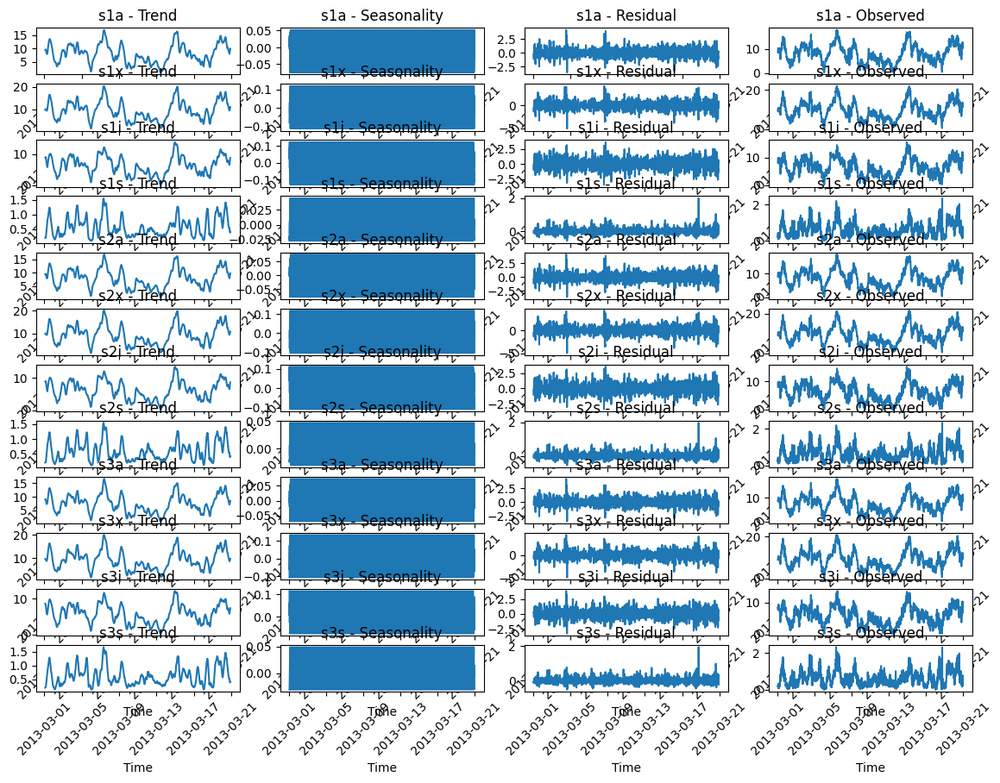

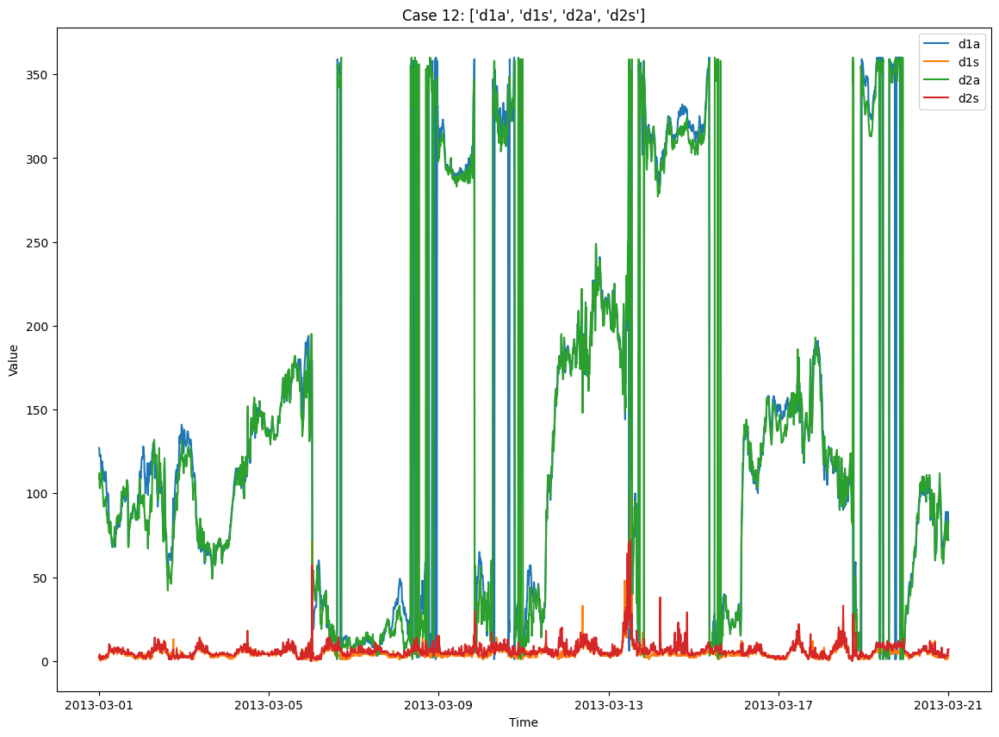

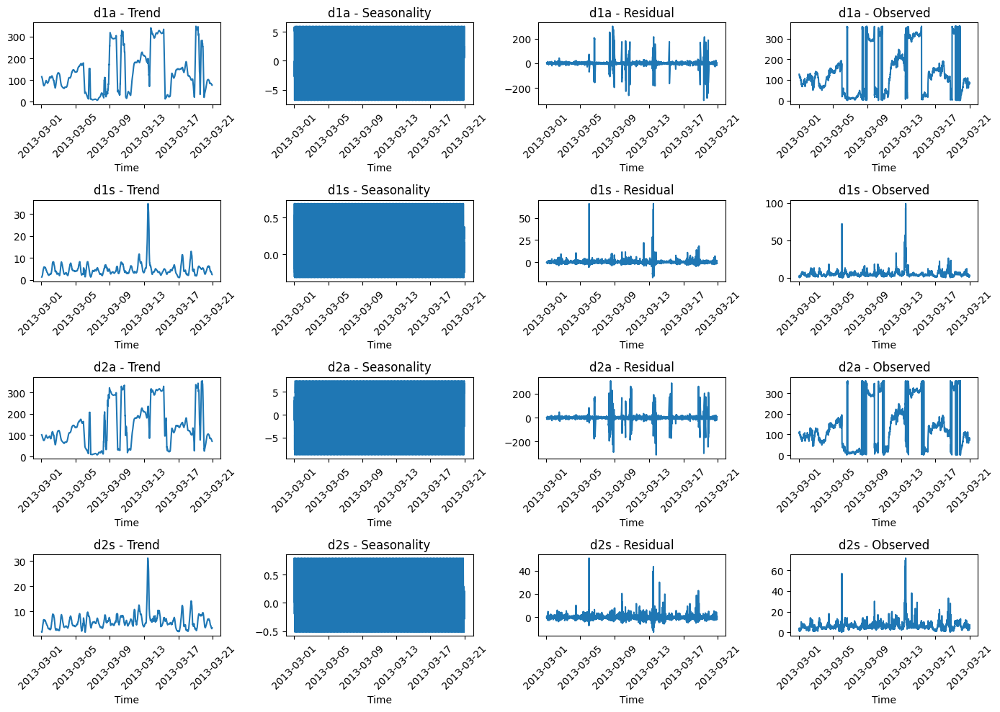

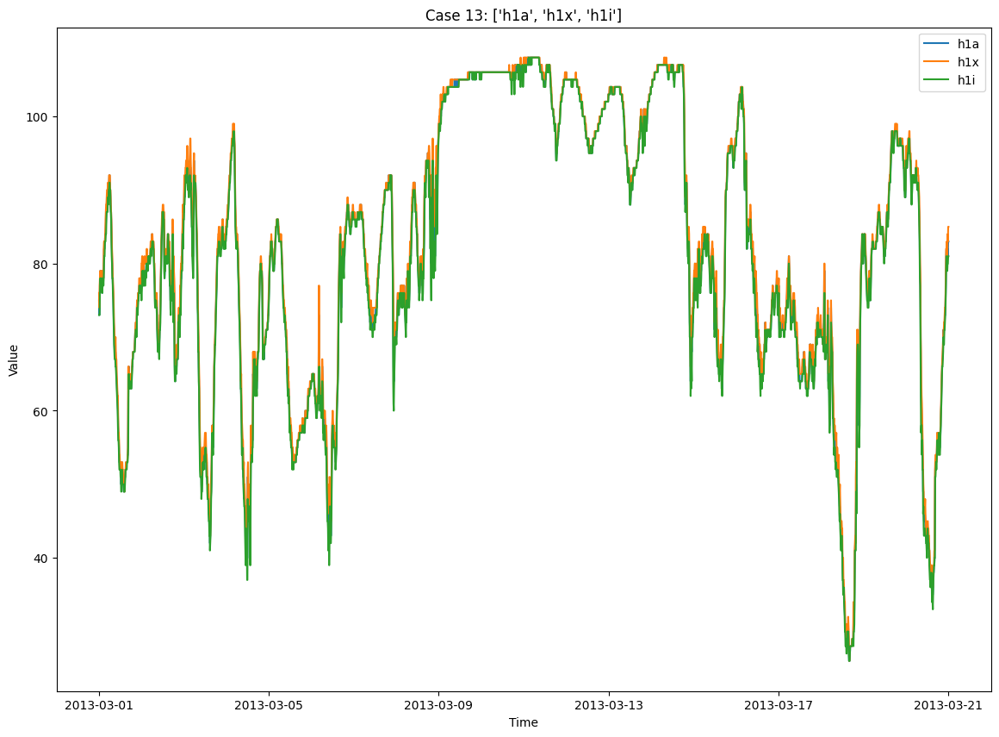

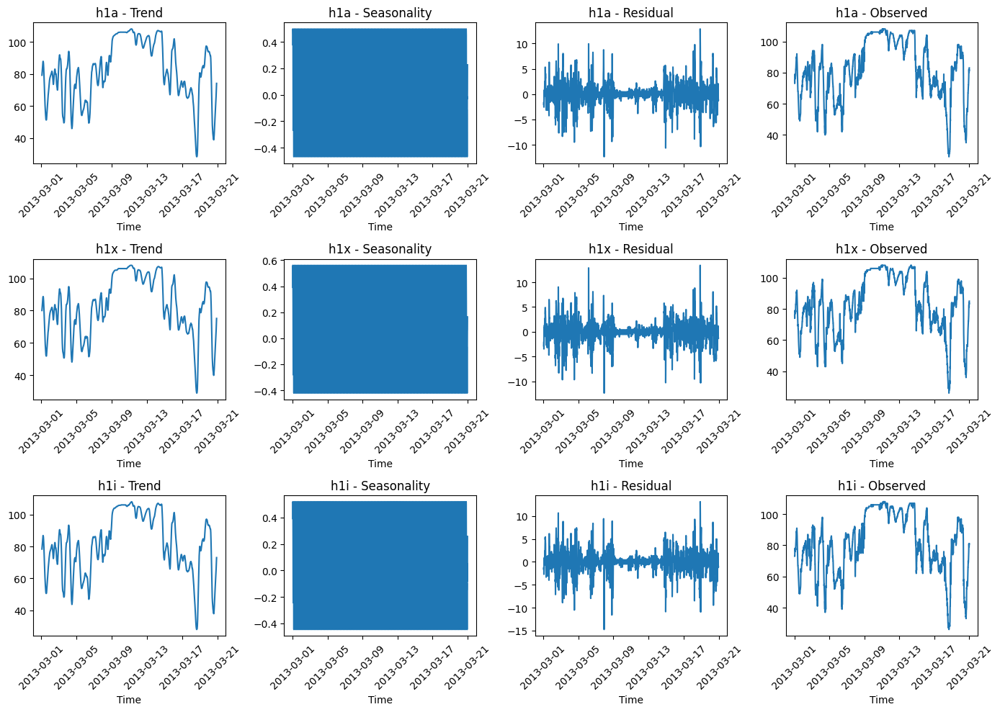

...

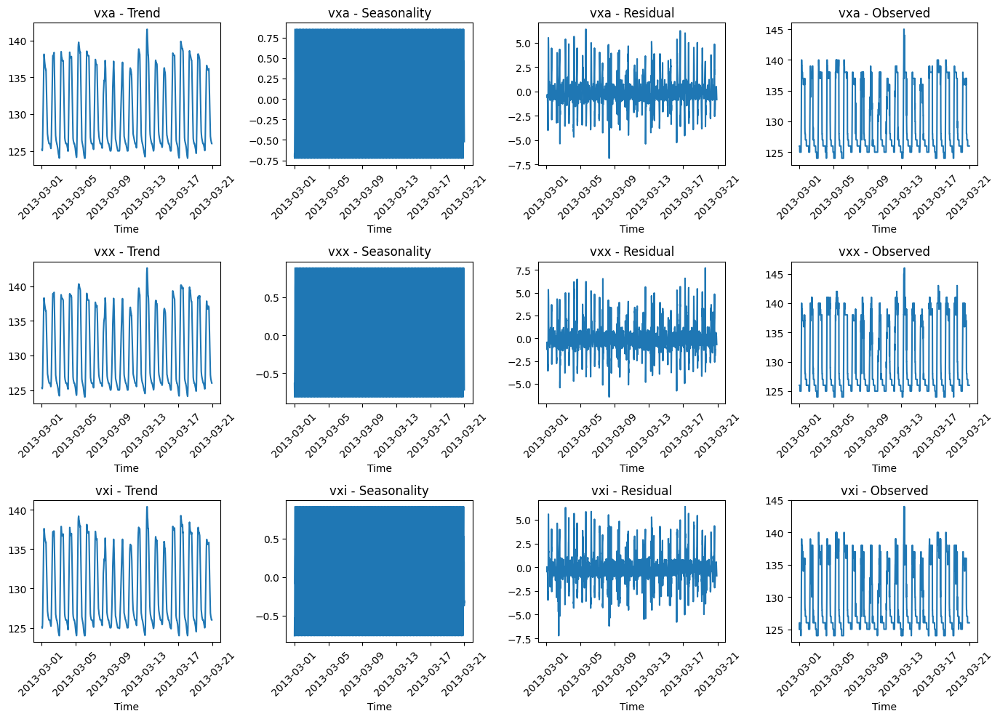

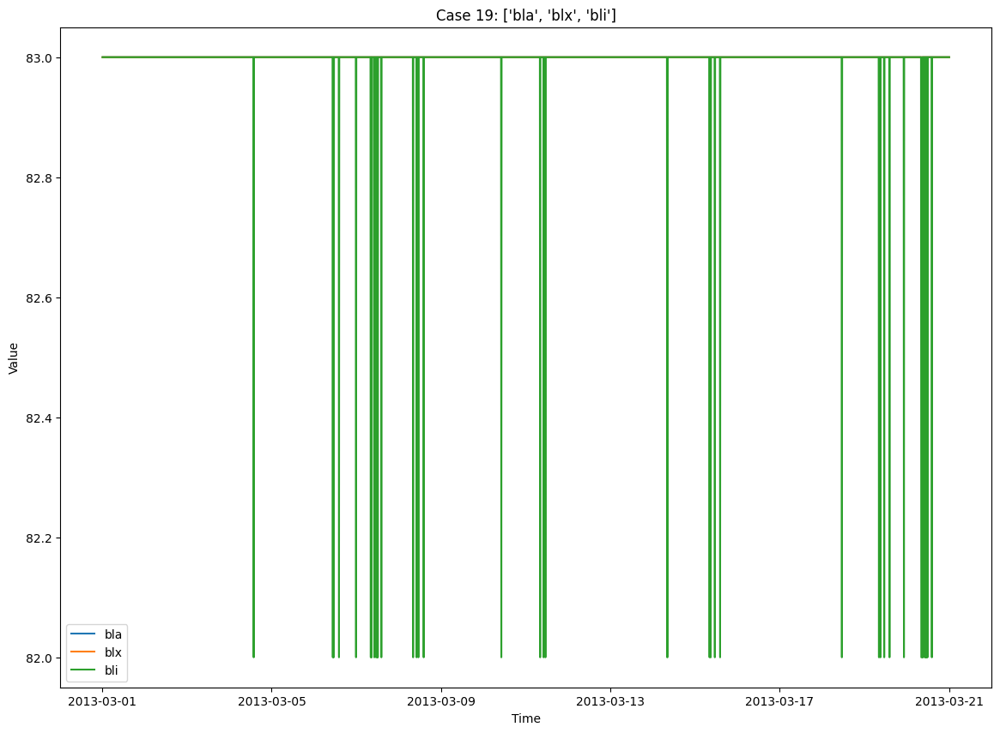

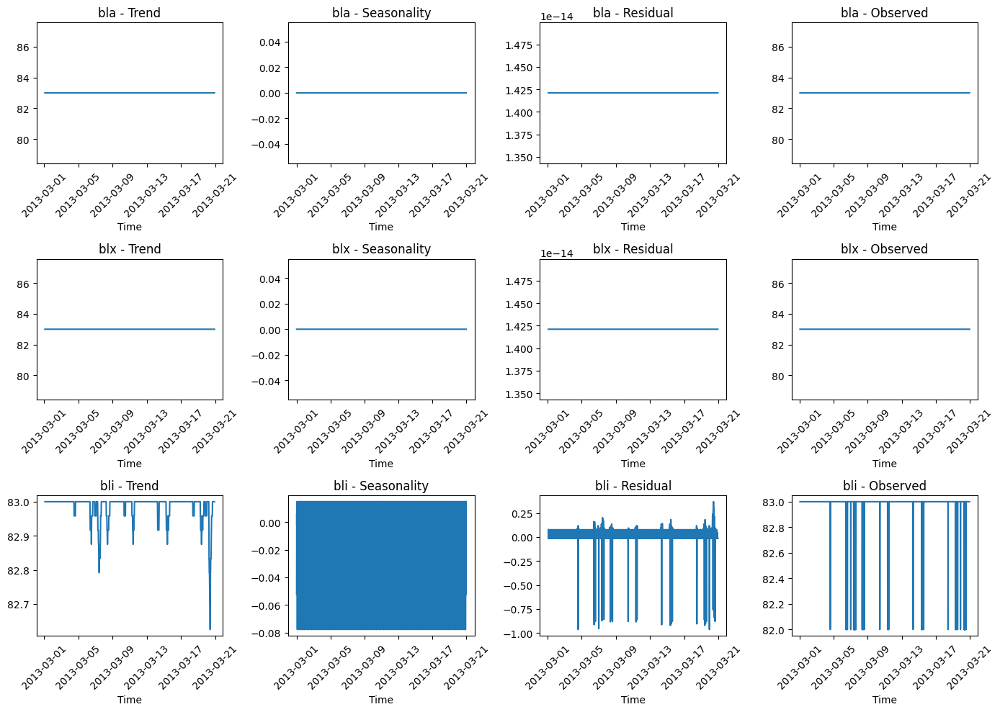

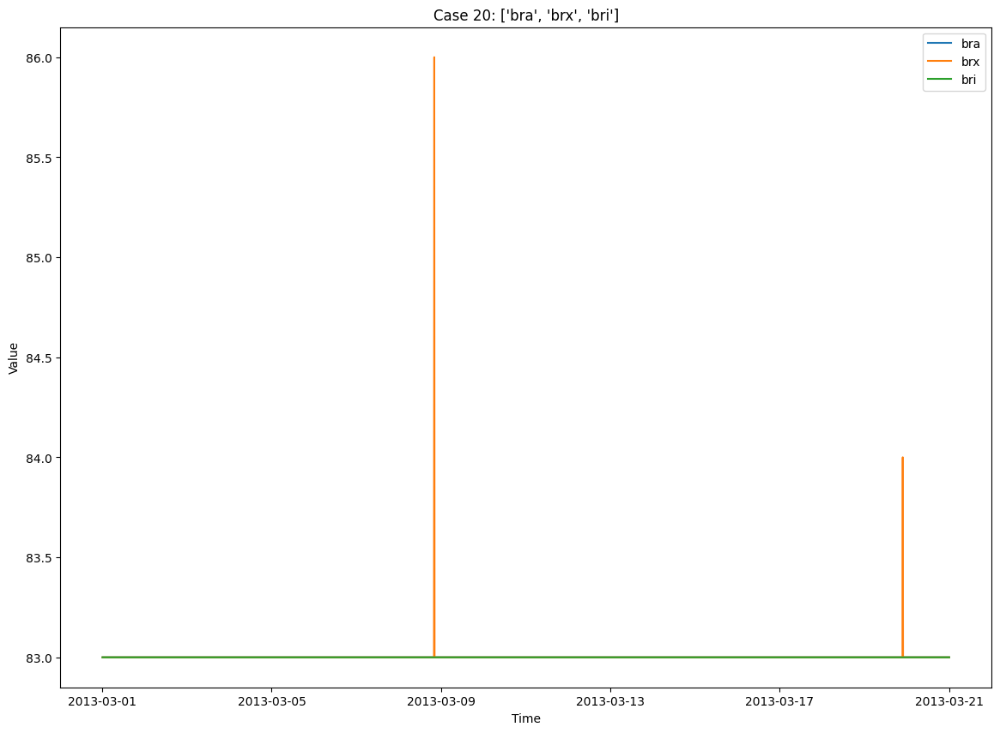

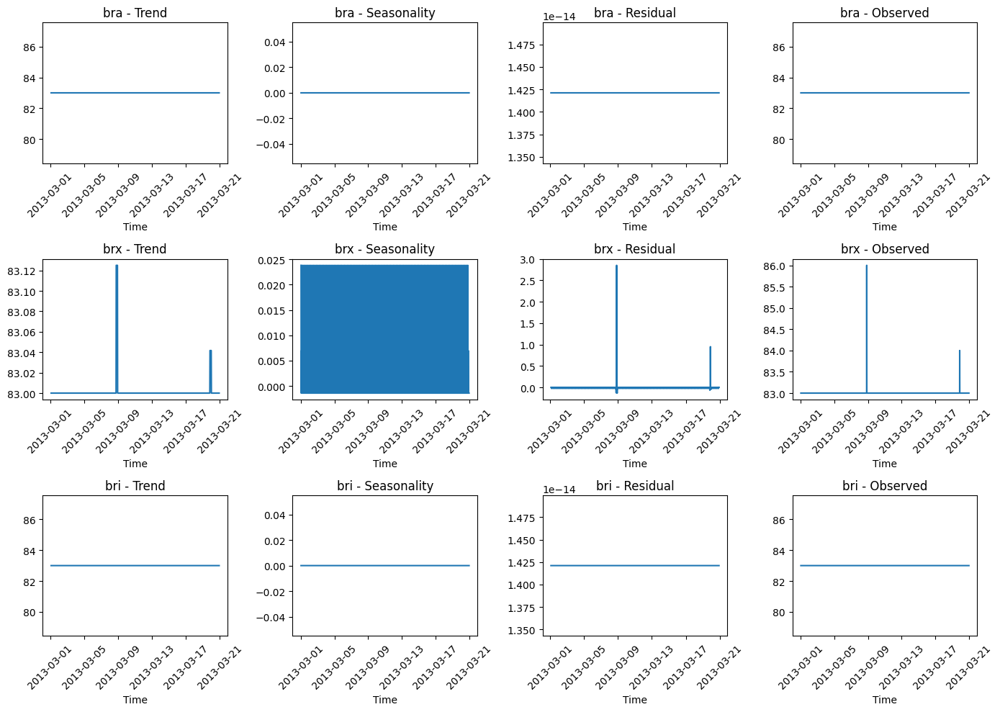

In [58]:
# List of cases with related fields
related_parameters = [
    ['s1a', 's2a', 's3a'],
    ['s1x', 's2x', 's3x'],
    ['s1i', 's2i', 's3i'],
    ['s1s', 's2s', 's3s'],
    ['s1a', 's1x', 's1i', 's1s'],
    ['s2a', 's2x', 's2i', 's2s'],
    ['s3a', 's3x', 's3i', 's3s'],
    ['d1a', 'd2a'],
    ['d1s', 'd2s'], 
    ['d1a', 'd1s'],
    ['d2a', 'd2s'], 
    ['s1a', 's1x', 's1i', 's1s', 's2a', 's2x', 's2i', 's2s', 's3a', 's3x', 's3i', 's3s'], 
    ['d1a', 'd1s', 'd2a', 'd2s'], 
    ['h1a', 'h1x', 'h1i'],
    ['t1a', 't1x', 't1i'],
    ['b1a', 'b1x', 'b1i'],
    ['p1a', 'p1x', 'p1i', 'p1s'],
    ['tia', 'tix', 'tii'],
    ['vxa', 'vxx', 'vxi'],
    ['bla', 'blx', 'bli'],
    ['bra', 'brx', 'bri']
]

# Perform data analysis for each case
for i, parameter in enumerate(related_parameters, start=0):
    plt.figure(figsize=(14, 10))
    
    # Plot time series for each field in the case
    for field in parameter:
        sns.lineplot(x=combined_df.index, y=combined_df[field], label=field)
    
    plt.title(f'Case {i}: '+ str(related_parameters[i]))
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

    # Decompose the time series into trend, seasonality, and residual components for each field in the case
    plt.figure(figsize=(14, 10))
    for j, field in enumerate(parameter, start=1):
        result = seasonal_decompose(combined_df[field], model='additive', period=24)  # Assuming seasonality is daily (24 hours)

        # Plot decomposed components
        plt.subplot(len(parameter), 4, j * 4 - 3)
        plt.plot(result.trend)
        plt.title(f'{field} - Trend')
        plt.xlabel('Time')
        plt.xticks(rotation=45)

        plt.subplot(len(parameter), 4, j * 4 - 2)
        plt.plot(result.seasonal)
        plt.title(f'{field} - Seasonality')
        plt.xlabel('Time')
        plt.xticks(rotation=45)

        plt.subplot(len(parameter), 4, j * 4 - 1)
        plt.plot(result.resid)
        plt.title(f'{field} - Residual')
        plt.xlabel('Time')
        plt.xticks(rotation=45)

        plt.subplot(len(parameter), 4, j * 4)
        plt.plot(result.observed)
        plt.title(f'{field} - Observed')
        plt.xlabel('Time')
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()
